In [1]:
import glob
import os
import subprocess

import itertools
from sklearn.linear_model import RidgeCV

# Plot settings
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from cycler import cycler

from sim_setup import build_submissions, load_data, set_up_dirs, _try_mkdir, \
    _load_samples

from statistics import mean

import math

from scipy.signal import savgol_filter
from sklearn.svm import SVC

#Set up colors and matplotlib parameters for plotting
COLORS = ['#242482', '#F00D2C', '#0071BE', '#4E8F00', '#553C67', '#DA5319']
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['axes.linewidth'] = 2
mpl.rcParams['lines.linewidth'] = 3
mpl.rcParams['font.size'] = 14
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Tahoma']
plt.rc('axes', prop_cycle=cycler(color=COLORS))

# This shall change depending on where this notebook is run. For now,
# we hard-code the path to the environment that
#ENV_DIR = "~/Documents/Projects/PIPELINES/bnl-pipelines/env"
ENV_DIR = "/projects/academic/kreyes3/BNL-Pipelines/env"


# Define some directories
BASE_DIR = os.getcwd()
SAMPLES_DIR = BASE_DIR + "/latent_samples"
STUDIES_DIR = BASE_DIR + "/studies"
FIGURES_DIR = BASE_DIR + "/figs"
_try_mkdir(SAMPLES_DIR)
_try_mkdir(STUDIES_DIR)
_try_mkdir(FIGURES_DIR)

def set_up_study(_study_name, _study, _base_params, _num_sims=1,
                 _num_sims_per_job=None, run=False):

    if _num_sims_per_job is None:
        _num_sims_per_job = _num_sims

    _script_dir, _res_dir = set_up_dirs(STUDIES_DIR, _study_name)
    build_submissions(_study_name, _study, _script_dir, _res_dir, SAMPLES_DIR,
                      ENV_DIR, BASE_DIR, _base_params)
    
    if run:
        # Run submissions
        for _file in glob.glob(_script_dir + "/submit*.sh"):
            _res = subprocess.run([BASE_DIR + "/fake_sbatch",
                                 "--array=0-%d:%d"%(_num_sims-1, _num_sims_per_job),
                                 _file], capture_output=True)
            if _res.stderr is not None and len(_res.stderr) > 0:
                print("\n", _res.stderr)
    return _res_dir

def one_dim_plot(_study, _res_dir, _var_idx=0):
    _data = load_data(_study, _res_dir)
    _vals = np.unique(_data[:, _var_idx])
    _avg_data = np.zeros([len(_vals), 3])
    for _i, _val in enumerate(_vals):
        _I = data[:, _var_idx] == _val
        _avg_data[_i] = np.mean(_data[_I][:, [_var_idx, -2, -1]], axis = 0)
    plot_beliefs(_avg_data)

    _study_var = _study[[_key for _key in _study.keys()][_var_idx]]
    if "scale" in _study_var and _study_var["scale"] == "log":
        plt.xscale('log')

def two_dim_plots(_study, _res_dir, _main_var_idx=0, _sub_var_idx=1,
                  _subplots=False, _sort_subvar=False, _legend=None):
    _vars = [_key for _key in _study.keys()]
    _main_var = _study[_vars[_main_var_idx]]
    _sub_var = _study[_vars[_sub_var_idx]]

    _data = load_data(_study, _res_dir)
    _main_vals_in_data = np.unique(_data[:, _main_var_idx])
    _main_vals = [val for val in _main_var['vals'] if val in _main_vals_in_data]
    _sub_vals_in_data = np.unique(_data[:, _sub_var_idx])
    _sub_vals = [val for val in _sub_var['vals'] if val in _sub_vals_in_data]

    _labels = [_study[var]['label'] for var in _study]
    _fmt_strs = [_study[var]['fmt_str'] for var in _study]

    _y_min = np.inf
    _y_max = -np.inf
    for _j, _x2 in enumerate(_sub_vals):
        _sub_data = _data[_data[:, _sub_var_idx] == _x2, :]

        _avg_data = np.zeros([len(_main_vals), 3])
        for _i, _x1 in enumerate(_main_vals):
            _I = _sub_data[:, _main_var_idx] == _x1
            _avg_data[_i] = np.mean(_sub_data[_I][:, [_main_var_idx, -2, -1]],
                                   axis = 0)
        if _subplots:
            plt.subplot(1, len(_sub_vals), _j+1)
        plot_beliefs(_avg_data)

        plt.xlabel(_labels[_main_var_idx])
        if "scale" in _main_var and _main_var["scale"] == "log":
            plt.xscale('log')

        if _subplots:
            plt.title((r'%%s = %s'%_fmt_strs[_sub_var_idx]) %
                      (_labels[_sub_var_idx], _x2))
            _y_lim = plt.ylim()

            if _y_lim[0] < _y_min:
                _y_min = _y_lim[0]
            if _y_lim[1] > _y_max:
                _y_max = _y_lim[1]

            if _legend is not None and _j == _legend:
                plt.legend(['OCBA', 'Exploration'])

    if _subplots:
        # common y limits for all subplots
        for _j, _x2 in enumerate(_sub_vals):
            plt.subplot(1, len(_sub_vals), _j+1)
            plt.ylim([_y_min, _y_max])
        plt.tight_layout()

def three_dim_subplots(_study, _res_dir, _main_var=0, _sub1_var=1, _sub2_var=2,
                       diff=False):
    _data = load_data(_study, _res_dir, cols=(-6, -5, -3, -2))
    _main_vals = np.unique(_data[:, _main_var])
    _sub1_vals = np.sort(np.unique(_data[:, _sub1_var]))
    _sub2_vals = np.sort(np.unique(_data[:, _sub2_var]))

    _labels = [_study[var]['label'] for var in _study]
    _fmt_strs = [_study[var]['fmt_str'] for var in _study]

    _y_min = np.inf
    _y_max = -np.inf

    for _k, _x2 in enumerate(_sub2_vals):
        for _j, _x1 in enumerate(_sub1_vals):
            _sub_data = _data[ (_data[:, _sub1_var] == _x1)&
                                (_data[:, _sub2_var] == _x2) , :]

            avg_data = np.zeros([len(_main_vals), 5])
            for _i, _x0 in enumerate(_main_vals):
                I = _sub_data[:, _main_var] == _x0
                avg_data[_i] = np.mean(
                    _sub_data[I][:, [_main_var, -4, -3, -2, -1]], axis = 0)
            plt.subplot(len(_sub2_vals), len(_sub1_vals),
                        _k*len(_sub1_vals)+_j+1)

            if diff:
                diff_data = np.hstack((avg_data[:, 0:1],
                    avg_data[:, 1:2] - avg_data[:, 3:4],
                    np.sqrt(avg_data[:, 2:3]**2 + avg_data[:, 4:5]**2)))
                plot_beliefs(diff_data)
            else:
                plot_beliefs(avg_data[:, [0, 1, 2]])
                plot_beliefs(avg_data[:, [0, 3, 4]])
            plt.title((r'%%s = %s, %%s=%s' %
                       (_fmt_strs[_sub1_var], _fmt_strs[_sub2_var]))%
                       (_labels[_sub1_var], _x1, _labels[_sub2_var], _x2))
            plt.xlabel(_labels[_main_var])
            _y_lim = plt.ylim()

            if _y_lim[0] < _y_min:
                _y_min = _y_lim[0]
            if _y_lim[1] > _y_max:
                _y_max = _y_lim[1]

            if not diff and _j == 0 and _k == 0:
                plt.legend(['OCBA', 'Exploration'])

    # common y limits for all subplots
    for _k, _x2 in enumerate(_sub2_vals):
        for _j, _x1 in enumerate(_sub1_vals):
            plt.subplot(len(_sub2_vals), len(_sub1_vals),
                        _k*len(_sub1_vals)+_j+1)
            plt.ylim([_y_min, _y_max])
    plt.tight_layout()

def plot_beliefs(data, stds=1):
    h = plt.plot(data[:, 0], data[:, 1])
    plt.fill_between(data[:,0], data[:,1]+stds*data[:,2],
                     data[:,1]-stds*data[:,2], color = h[0].get_color(),
                     alpha=0.1)

# Initial studies

### Simulation with all stages and policies -2, -3, -4, -5, -6

In [2]:
BASE_PARAMS = {"ns":3, "ds": 1, "ls": 0.2, "nx": 500, "dx": 8, "lx": 1.0,
               "s0":1, "cost_mode": "exp", "cost_inc": 10, "C_max": 2500,
               "policy_param": -1, "stage_idx": 0, "cand_idx": 0}

STUDY_NAME = "param_stage_study_test_1"

# policy param -1 didn't work in this specific simulation due to a bug. Bug now fixed, and will run in next simulation
POLICY_PARAMS = [-1, -2, -3, -4, -5, -6]

STAGE_SAMPLE_IDXS = [*range(150)]

study = {
    "stage_idx": {
        "vals": STAGE_SAMPLE_IDXS,
        "fmt_str": "%02d", "label": r"$i$"
    },
    "policy_param": {
        "vals": POLICY_PARAMS,
        "fmt_str": "%04.2f", "label": r"$\pi$"},
}

In [3]:
# # DO NOT RUN THIS CELL (JUST THE FIRST TIME)
# set_up_study(STUDY_NAME, study, BASE_PARAMS)

# output: '/projects/academic/kreyes3/BNL-Pipelines/bnl-pipelines/sims/policy_sims23/studies/param_stage_study_test_1/res'

In [4]:
res_dir = "%s/%s/res"%(STUDIES_DIR, STUDY_NAME)

data_1 = load_data(study, res_dir)

### Simulation with all stages and policies -1, 0.5, 1.01, 1.1, 2, 11, 101

In [5]:
BASE_PARAMS = {"ns":3, "ds": 1, "ls": 0.2, "nx": 500, "dx": 8, "lx": 1.0,
               "s0":1, "cost_mode": "exp", "cost_inc": 10, "C_max": 2500,
               "policy_param": -1, "stage_idx": 0, "cand_idx": 0}

STUDY_NAME = "param_stage_study_test_2"

POLICY_PARAMS = [-1,0.5,1.01,1.1,2,11,101]

STAGE_SAMPLE_IDXS = [*range(150)]

study = {
    "stage_idx": {
        "vals": STAGE_SAMPLE_IDXS,
        "fmt_str": "%02d", "label": r"$i$"
    },
    "policy_param": {
        "vals": POLICY_PARAMS,
        "fmt_str": "%04.2f", "label": r"$\pi$"},
}

In [6]:
# # DO NOT RUN THIS CELL (JUST THE FIRST TIME)
# set_up_study(STUDY_NAME, study, BASE_PARAMS)

# output: '/projects/academic/kreyes3/BNL-Pipelines/bnl-pipelines/sims/policy_sims23/studies/param_stage_study_test_2/res'

In [7]:
res_dir = "%s/%s/res"%(STUDIES_DIR, STUDY_NAME)

data_2 = load_data(study, res_dir)

### Simulation with all stages and policies 0.25, 0.75

In [8]:
BASE_PARAMS = {"ns":3, "ds": 1, "ls": 0.2, "nx": 500, "dx": 8, "lx": 1.0,
               "s0":1, "cost_mode": "exp", "cost_inc": 10, "C_max": 2500,
               "policy_param": -1, "stage_idx": 0, "cand_idx": 0}

STUDY_NAME = "param_stage_study_test_3"

POLICY_PARAMS = [0.25,0.75]

STAGE_SAMPLE_IDXS = [*range(150)]

study = {
    "stage_idx": {
        "vals": STAGE_SAMPLE_IDXS,
        "fmt_str": "%02d", "label": r"$i$"
    },
    "policy_param": {
        "vals": POLICY_PARAMS,
        "fmt_str": "%04.2f", "label": r"$\pi$"},
}

In [9]:
# # DO NOT RUN THIS CELL (JUST THE FIRST TIME)
# set_up_study(STUDY_NAME, study, BASE_PARAMS)

# output: '/projects/academic/kreyes3/BNL-Pipelines/bnl-pipelines/sims/policy_sims23/studies/param_stage_study_test_3/res'

In [10]:
res_dir = "%s/%s/res"%(STUDIES_DIR, STUDY_NAME)

data_3 = load_data(study, res_dir)

In [11]:
data = np.vstack((data_1,data_2,data_3))

In [12]:
type(data)

numpy.ndarray

In [13]:
print(data.shape)

(2100, 4)


In [14]:
print(data)

[[ 0.         -2.          1.36537747  0.8013098 ]
 [ 0.         -3.          1.23718524  0.84407494]
 [ 0.         -4.          1.85242417  0.82221009]
 ...
 [98.          0.75        1.4085679   0.56923758]
 [99.          0.25        1.75696986  0.8360884 ]
 [99.          0.75        1.83774592  0.77084842]]


In [15]:
policy_2 = [i for i in data if i[1]==-2]
policy_2

[array([ 0.        , -2.        ,  1.36537747,  0.8013098 ]),
 array([ 1.        , -2.        ,  1.19773886,  0.87468844]),
 array([ 2.        , -2.        ,  1.27363617,  0.79592583]),
 array([ 3.        , -2.        ,  1.20342988,  0.76074074]),
 array([ 4.        , -2.        ,  1.24065797,  0.73363476]),
 array([ 5.        , -2.        ,  1.24938874,  0.7243802 ]),
 array([ 6.        , -2.        ,  1.22271617,  0.68730473]),
 array([ 7.        , -2.        ,  1.4048627 ,  0.79443423]),
 array([ 8.        , -2.        ,  1.30641815,  0.85367229]),
 array([ 9.        , -2.        ,  1.32842201,  0.80986794]),
 array([100.        ,  -2.        ,   1.30219078,   0.74944546]),
 array([101.        ,  -2.        ,   1.29989175,   0.75030683]),
 array([102.        ,  -2.        ,   1.30652147,   0.79617255]),
 array([103.        ,  -2.        ,   1.29807094,   0.8829296 ]),
 array([104.        ,  -2.        ,   1.39432411,   0.83687286]),
 array([105.        ,  -2.        ,   1.28199137, 

In [16]:
len(policy_2)

150

In [17]:
policy_3 = [i for i in data if i[1]==-3]

In [18]:
policy_3

[array([ 0.        , -3.        ,  1.23718524,  0.84407494]),
 array([ 1.        , -3.        ,  0.87215144,  0.56049397]),
 array([ 2.        , -3.        ,  1.10668574,  0.66482532]),
 array([ 3.        , -3.        ,  1.04749685,  0.70299983]),
 array([ 4.        , -3.        ,  1.75182567,  1.13904114]),
 array([ 5.        , -3.        ,  1.49193496,  1.0251303 ]),
 array([ 6.        , -3.        ,  1.30455038,  0.87136762]),
 array([ 7.        , -3.        ,  1.47622377,  0.90704213]),
 array([ 8.        , -3.        ,  1.44580629,  0.90777501]),
 array([ 9.        , -3.        ,  1.27297971,  0.77541722]),
 array([100.        ,  -3.        ,   1.06068406,   0.77454598]),
 array([101.        ,  -3.        ,   1.30665555,   0.80514663]),
 array([102.        ,  -3.        ,   1.54729895,   1.17125234]),
 array([103.        ,  -3.        ,   1.32632339,   0.86950156]),
 array([104.        ,  -3.        ,   1.60235911,   0.92394517]),
 array([105.        ,  -3.        ,   0.68771696, 

In [19]:
len(policy_3)

150

In [20]:
policy_4 = [i for i in data if i[1]==-4]

In [21]:
policy_4

[array([ 0.        , -4.        ,  1.85242417,  0.82221009]),
 array([ 1.        , -4.        ,  1.27865855,  0.47580011]),
 array([ 2.        , -4.        ,  1.0716707 ,  0.64766375]),
 array([ 3.        , -4.        ,  1.41397297,  0.70819167]),
 array([ 4.        , -4.        ,  2.58538956,  1.147708  ]),
 array([ 5.        , -4.        ,  2.3661465 ,  0.91616789]),
 array([ 6.        , -4.        ,  1.3695439 ,  0.82792171]),
 array([ 7.        , -4.        ,  2.22364686,  0.81279426]),
 array([ 8.        , -4.        ,  1.88630907,  0.89591393]),
 array([ 9.        , -4.        ,  2.04119315,  0.77661218]),
 array([100.        ,  -4.        ,   1.74849507,   0.63969903]),
 array([101.        ,  -4.        ,   1.7123523 ,   0.76907069]),
 array([102.        ,  -4.        ,   2.44772561,   0.99088473]),
 array([103.        ,  -4.        ,   2.14945922,   0.77463023]),
 array([104.        ,  -4.        ,   2.25423886,   1.06114903]),
 array([105.        ,  -4.        ,   0.62441405, 

In [22]:
len(policy_4)

150

In [23]:
policy_5 = [i for i in data if i[1]==-5]

In [24]:
policy_5

[array([ 0.        , -5.        ,  1.8744774 ,  0.74151147]),
 array([ 1.        , -5.        ,  1.28687396,  0.47211866]),
 array([ 2.        , -5.        ,  0.99409535,  0.6264424 ]),
 array([ 3.        , -5.        ,  1.40136861,  0.71676733]),
 array([ 4.        , -5.        ,  2.63083318,  1.1056044 ]),
 array([ 5.        , -5.        ,  2.2602116 ,  0.93201057]),
 array([ 6.        , -5.        ,  1.37493978,  0.8805015 ]),
 array([ 7.        , -5.        ,  2.21140356,  0.86955781]),
 array([ 8.        , -5.        ,  1.81936024,  0.91591583]),
 array([ 9.        , -5.        ,  2.06785101,  0.76848649]),
 array([100.        ,  -5.        ,   1.70318719,   0.67924776]),
 array([101.        ,  -5.        ,   1.71303125,   0.79491816]),
 array([102.        ,  -5.        ,   2.2970235 ,   1.06165291]),
 array([103.        ,  -5.        ,   2.21822556,   0.87063796]),
 array([104.        ,  -5.        ,   2.3265384 ,   0.90909624]),
 array([105.        ,  -5.        ,   0.68187056, 

In [25]:
len(policy_5)

150

In [26]:
policy_6 = [i for i in data if i[1]==-6]

In [27]:
policy_6

[array([ 0.        , -6.        ,  0.4273045 ,  0.80744429]),
 array([ 1.        , -6.        , -0.53056818,  0.47196218]),
 array([ 2.        , -6.        ,  0.81756525,  0.69349988]),
 array([ 3.        , -6.        ,  0.68736516,  0.7380884 ]),
 array([ 4.        , -6.        , -0.35865502,  1.01821313]),
 array([ 5.        , -6.        , -0.69015653,  0.8913624 ]),
 array([ 6.        , -6.        ,  0.95495146,  0.82594354]),
 array([ 7.        , -6.        , -0.94565222,  0.90434975]),
 array([ 8.        , -6.        ,  0.40989852,  1.05498883]),
 array([ 9.        , -6.        , -0.71014512,  0.78022973]),
 array([100.        ,  -6.        ,  -0.4737039 ,   0.67852887]),
 array([101.        ,  -6.        ,   0.83717459,   0.82886909]),
 array([ 1.02000000e+02, -6.00000000e+00,  8.41423564e-02,  1.05010229e+00]),
 array([103.        ,  -6.        ,  -0.63676675,   0.93909563]),
 array([104.        ,  -6.        ,   0.1334834 ,   1.04041668]),
 array([105.        ,  -6.        ,   

In [28]:
len(policy_6)

150

let's see the average reward means and std:

In [29]:
policy_6_means = [i[2] for i in policy_6]
policy_6_means

[0.4273045040448341,
 -0.5305681835516983,
 0.8175652461754336,
 0.6873651597398402,
 -0.3586550247216391,
 -0.6901565341052294,
 0.9549514620837691,
 -0.9456522247624193,
 0.40989851911119823,
 -0.7101451182053486,
 -0.47370389893592557,
 0.83717458864249,
 0.08414235641823155,
 -0.6367667495567519,
 0.13348339791277763,
 0.509383227044433,
 -0.40296054623519206,
 -0.5193868423031658,
 0.7752970118648647,
 0.963814646298387,
 0.5296616023457729,
 0.13683175911692885,
 1.0333984658231214,
 0.848588710316378,
 0.6503639200720114,
 0.47077774177136883,
 0.6576202203724248,
 0.9625908026553137,
 -0.15608402412740568,
 0.33136917296857205,
 -0.30145366723908473,
 0.13044192046206657,
 0.4312353748141804,
 -0.07239144794549204,
 0.8907980611632599,
 0.35114805923532283,
 0.8519646436654457,
 0.7011498542678828,
 0.13954176672628638,
 -0.38187557616812007,
 0.07198192042158474,
 -0.9563845699525279,
 0.07195814704509862,
 0.5982186834266796,
 -0.06679359489825638,
 -0.17248804038859128,
 0.6

In [30]:
policy_6_means_avg = mean(policy_6_means)
policy_6_means_avg

0.2707110680043291

In [31]:
policy_6_sd = [i[3] for i in policy_6]
policy_6_sd

[0.807444292136526,
 0.47196217609484853,
 0.6934998796777151,
 0.7380883986142388,
 1.0182131339547105,
 0.8913624032041002,
 0.8259435427688344,
 0.9043497487162436,
 1.054988828660101,
 0.7802297296841038,
 0.67852887481703,
 0.8288690877253061,
 1.0501022908966078,
 0.9390956262274797,
 1.0404166806776312,
 0.4543627183118289,
 0.9988704096592008,
 0.8619351785533964,
 0.8194637485388522,
 0.7882583633084009,
 0.8637546887116844,
 1.0032852148600224,
 0.9143820814241959,
 0.8396763082030021,
 0.8344437335956909,
 0.7006926334466411,
 0.6997872695414041,
 0.88326931508761,
 1.066781149733734,
 1.0127795549697847,
 0.4681527471983694,
 1.074634917968965,
 1.057437277168903,
 0.5831426653221778,
 0.8193946448092644,
 0.978769641447207,
 0.9017420423465121,
 0.8411791308318418,
 0.9785294709271826,
 0.9933386465804015,
 1.0480958348357625,
 0.7054977367680577,
 1.132420066690474,
 0.8433133097257599,
 1.0995433777735706,
 0.6195982305559609,
 0.846231080616958,
 0.4182861141918764,
 0.

In [32]:
policy_6_sd_avg = mean(policy_6_sd)
policy_6_sd_avg

0.8341635912804087

In [33]:
policy_2_means = [i[2] for i in policy_2]
policy_2_means_avg = mean(policy_2_means)
print(policy_2_means_avg)

policy_2_sd = [i[3] for i in policy_2]
policy_2_sd_avg = mean(policy_2_sd)
print(policy_2_sd_avg)

1.2901160525652609
0.7962590308484663


In [34]:
policy_3_means = [i[2] for i in policy_3]
policy_3_means_avg = mean(policy_3_means)
print(policy_3_means_avg)

policy_3_sd = [i[3] for i in policy_3]
policy_3_sd_avg = mean(policy_3_sd)
print(policy_3_sd_avg)

1.261537699979287
0.8139947809839357


In [35]:
policy_4_means = [i[2] for i in policy_4]
policy_4_means_avg = mean(policy_4_means)
print(policy_4_means_avg)

policy_4_sd = [i[3] for i in policy_4]
policy_4_sd_avg = mean(policy_4_sd)
print(policy_4_sd_avg)

1.7358678095566957
0.8109708336458907


In [36]:
policy_5_means = [i[2] for i in policy_5]
policy_5_means_avg = mean(policy_5_means)
print(policy_5_means_avg)

policy_5_sd = [i[3] for i in policy_5]
policy_5_sd_avg = mean(policy_5_sd)
print(policy_5_sd_avg)

1.7346579657919265
0.8173763930558411


In [37]:
print(policy_6_means_avg)
print(policy_6_sd_avg)

0.2707110680043291
0.8341635912804087


First quick impression:

All policies have a standard deviation of around 0.8

Policy 4 and 5 perform best on average with a reward of around 1.735 (policy 4 slightly better and more certain)

Policies 2 and 3 are next with 1.29 and 1.26 respectively

Policy 6 is last at 0.27

In [38]:
policy_1 = [i for i in data if i[1]==-1]
policy_1

[array([ 0.        , -1.        ,  1.82315202,  0.73402293]),
 array([ 1.        , -1.        ,  1.2776616 ,  0.52578288]),
 array([ 2.        , -1.        ,  0.92068466,  0.72995197]),
 array([ 3.        , -1.        ,  1.22961448,  0.73639126]),
 array([ 4.        , -1.        ,  2.65205656,  0.98535118]),
 array([ 5.       , -1.       ,  2.3414152,  0.9708603]),
 array([ 6.        , -1.        ,  1.34483043,  0.79935856]),
 array([ 7.        , -1.        ,  2.19410349,  0.69956905]),
 array([ 8.        , -1.        ,  1.79628161,  0.92912923]),
 array([ 9.        , -1.        ,  2.03786806,  0.86545357]),
 array([100.        ,  -1.        ,   1.77534036,   0.68490452]),
 array([101.       ,  -1.       ,   1.7058318,   0.811402 ]),
 array([102.        ,  -1.        ,   2.16622013,   1.10451863]),
 array([103.        ,  -1.        ,   2.21477334,   0.79476628]),
 array([104.        ,  -1.        ,   2.18647648,   0.97849457]),
 array([105.        ,  -1.        ,   0.70939704,   0.4421

In [39]:
len(policy_1)

150

In [40]:
policy0p5 = [i for i in data if i[1]==0.5]
policy0p5

[array([0.        , 0.5       , 1.73332294, 0.83299631]),
 array([1.        , 0.5       , 1.25238325, 0.50239298]),
 array([2.        , 0.5       , 1.00963907, 0.62176827]),
 array([3.        , 0.5       , 1.31724763, 0.69720205]),
 array([4.        , 0.5       , 2.66139586, 1.0622955 ]),
 array([5.        , 0.5       , 2.29169086, 1.04435252]),
 array([6.        , 0.5       , 1.45581258, 0.83713857]),
 array([7.        , 0.5       , 2.1756956 , 0.92967848]),
 array([8.        , 0.5       , 1.82395736, 0.89025421]),
 array([9.        , 0.5       , 1.96808338, 0.86693971]),
 array([100.        ,   0.5       ,   1.73401282,   0.68052341]),
 array([101.        ,   0.5       ,   1.82557896,   0.81423301]),
 array([102.        ,   0.5       ,   2.19110031,   1.11164542]),
 array([103.        ,   0.5       ,   2.08441429,   0.87035954]),
 array([104.        ,   0.5       ,   2.11131326,   1.11448001]),
 array([105.        ,   0.5       ,   0.69036383,   0.44261156]),
 array([106.        ,   

In [41]:
len(policy0p5)

150

In [42]:
policy1p01 = [i for i in data if i[1]==1.01]
policy1p01

[array([0.        , 1.01      , 1.26547459, 0.81554781]),
 array([1.        , 1.01      , 0.81781394, 0.46643435]),
 array([2.        , 1.01      , 1.0521635 , 0.69018355]),
 array([3.        , 1.01      , 1.0515388 , 0.67943786]),
 array([4.        , 1.01      , 1.72556166, 1.19485425]),
 array([5.        , 1.01      , 1.47379829, 0.94073984]),
 array([6.        , 1.01      , 1.26115699, 0.75210242]),
 array([7.        , 1.01      , 1.3284394 , 0.98649112]),
 array([8.        , 1.01      , 1.36811164, 0.9453309 ]),
 array([9.        , 1.01      , 1.26507573, 0.85969877]),
 array([100.        ,   1.01      ,   1.05248064,   0.68308206]),
 array([101.        ,   1.01      ,   1.22472738,   0.81262677]),
 array([102.        ,   1.01      ,   1.60546429,   1.11789181]),
 array([103.        ,   1.01      ,   1.33073895,   0.82412926]),
 array([104.        ,   1.01      ,   1.63732719,   0.95180986]),
 array([105.        ,   1.01      ,   0.71804721,   0.41146968]),
 array([106.        ,   

In [43]:
len(policy1p01)

150

In [44]:
policy1p1 = [i for i in data if i[1]==1.1]
policy1p1

[array([0.        , 1.1       , 1.5912727 , 0.73452248]),
 array([1.        , 1.1       , 1.22288411, 0.48730093]),
 array([2.        , 1.1       , 1.05488155, 0.70199408]),
 array([3.        , 1.1       , 1.21974675, 0.69261184]),
 array([4.        , 1.1       , 2.2950188 , 1.06091732]),
 array([5.        , 1.1       , 2.15549592, 0.80497979]),
 array([6.        , 1.1       , 1.25649966, 0.87503215]),
 array([7.        , 1.1       , 2.12488983, 0.87799672]),
 array([8.        , 1.1       , 1.67747757, 0.89612616]),
 array([9.        , 1.1       , 1.98277852, 0.72091722]),
 array([100.        ,   1.1       ,   1.5472502 ,   0.64572477]),
 array([101.        ,   1.1       ,   1.70634545,   0.81172796]),
 array([102.        ,   1.1       ,   2.03481481,   1.0363951 ]),
 array([103.        ,   1.1       ,   2.08487145,   0.88405552]),
 array([104.        ,   1.1       ,   2.02740651,   1.06002884]),
 array([105.        ,   1.1       ,   0.70225141,   0.43062297]),
 array([106.        ,   

In [45]:
len(policy1p1)

150

In [46]:
policy2 = [i for i in data if i[1]==2]
policy2

[array([0.        , 2.        , 1.78802981, 0.80479574]),
 array([1.        , 2.        , 1.30159381, 0.45611866]),
 array([2.        , 2.        , 1.00587405, 0.70625486]),
 array([3.        , 2.        , 1.34553006, 0.65982466]),
 array([4.        , 2.        , 2.78977186, 1.0314955 ]),
 array([5.        , 2.        , 2.31000473, 0.80153376]),
 array([6.        , 2.        , 1.39058685, 0.84975661]),
 array([7.        , 2.        , 2.19425417, 0.84166778]),
 array([8.        , 2.        , 1.89786519, 0.99366159]),
 array([9.        , 2.        , 2.162754  , 0.70207736]),
 array([100.        ,   2.        ,   1.74545565,   0.72806278]),
 array([101.        ,   2.        ,   1.663023  ,   0.79341256]),
 array([102.        ,   2.        ,   2.37108208,   0.95102285]),
 array([103.        ,   2.        ,   2.23095319,   0.88250219]),
 array([104.        ,   2.        ,   2.24082659,   0.99483719]),
 array([105.        ,   2.        ,   0.7050532 ,   0.45883783]),
 array([106.        ,   

In [47]:
len(policy2)

150

In [48]:
policy11 = [i for i in data if i[1]==11]
policy11

[array([ 0.        , 11.        ,  1.8008747 ,  0.79866774]),
 array([ 1.        , 11.        ,  1.29850017,  0.47981864]),
 array([ 2.        , 11.        ,  0.95026664,  0.67477419]),
 array([ 3.        , 11.        ,  1.35722895,  0.70981413]),
 array([ 4.        , 11.        ,  2.68210702,  0.99980098]),
 array([ 5.        , 11.        ,  2.28542716,  0.89234592]),
 array([ 6.        , 11.        ,  1.43424973,  0.83025529]),
 array([ 7.        , 11.        ,  2.25720919,  0.79099747]),
 array([ 8.        , 11.        ,  1.89413452,  0.94985224]),
 array([ 9.        , 11.        ,  2.07240807,  0.80916575]),
 array([100.        ,  11.        ,   1.73414623,   0.76680597]),
 array([101.        ,  11.        ,   1.72850257,   0.69374357]),
 array([102.        ,  11.        ,   2.33643288,   0.94075574]),
 array([103.        ,  11.        ,   2.22414549,   0.93367111]),
 array([104.        ,  11.        ,   2.29973302,   0.98076698]),
 array([105.        ,  11.        ,   0.6827061 , 

In [49]:
len(policy11)

150

In [50]:
policy101 = [i for i in data if i[1]==101]
policy101

[array([  0.        , 101.        ,   1.79625861,   0.7348946 ]),
 array([  1.        , 101.        ,   1.27816908,   0.47820596]),
 array([  2.        , 101.        ,   0.98815536,   0.67820789]),
 array([  3.        , 101.        ,   1.36727108,   0.79152854]),
 array([  4.        , 101.        ,   2.65679457,   1.05718953]),
 array([  5.        , 101.        ,   2.43503882,   0.84391847]),
 array([  6.        , 101.        ,   1.37322317,   0.79272988]),
 array([  7.        , 101.        ,   2.23760312,   0.84130523]),
 array([  8.        , 101.        ,   1.82670743,   0.86608852]),
 array([  9.        , 101.        ,   2.0830383 ,   0.92540096]),
 array([100.        , 101.        ,   1.69610824,   0.62119297]),
 array([101.        , 101.        ,   1.74905431,   0.76592007]),
 array([102.        , 101.        ,   2.38975658,   0.99332077]),
 array([103.        , 101.        ,   2.19760067,   0.85473506]),
 array([104.        , 101.        ,   2.36269511,   1.13276084]),
 array([10

In [51]:
len(policy101)

150

In [52]:
policy_1_means = [i[2] for i in policy_1]
policy_1_means_avg = mean(policy_1_means)
print(policy_1_means_avg)

policy_1_sd = [i[3] for i in policy_1]
policy_1_sd_avg = mean(policy_1_sd)
print(policy_1_sd_avg)

1.7056451325198476
0.8174553790452944


In [53]:
policy0p5_means = [i[2] for i in policy0p5]
policy0p5_means_avg = mean(policy0p5_means)
print(policy0p5_means_avg)

policy0p5_sd = [i[3] for i in policy0p5]
policy0p5_sd_avg = mean(policy0p5_sd)
print(policy0p5_sd_avg)

1.6988260331577805
0.8045523165264498


In [54]:
policy1p01_means = [i[2] for i in policy1p01]
policy1p01_means_avg = mean(policy1p01_means)
print(policy1p01_means_avg)

policy1p01_sd = [i[3] for i in policy1p01]
policy1p01_sd_avg = mean(policy1p01_sd)
print(policy1p01_sd_avg)

1.2691268064712666
0.8175812017878269


In [55]:
policy1p1_means = [i[2] for i in policy1p1]
policy1p1_means_avg = mean(policy1p1_means)
print(policy1p1_means_avg)

policy1p1_sd = [i[3] for i in policy1p1]
policy1p1_sd_avg = mean(policy1p1_sd)
print(policy1p1_sd_avg)

1.5781792091290407
0.813967082276912


In [56]:
policy2_means = [i[2] for i in policy2]
policy2_means_avg = mean(policy2_means)
print(policy2_means_avg)

policy2_sd = [i[3] for i in policy2]
policy2_sd_avg = mean(policy2_sd)
print(policy2_sd_avg)

1.7420409092635545
0.8061686559847351


In [57]:
policy11_means = [i[2] for i in policy11]
policy11_means_avg = mean(policy11_means)
print(policy11_means_avg)

policy11_sd = [i[3] for i in policy11]
policy11_sd_avg = mean(policy11_sd)
print(policy11_sd_avg)

1.7404681418783676
0.8078302756749179


In [58]:
policy101_means = [i[2] for i in policy101]
policy101_means_avg = mean(policy101_means)
print(policy101_means_avg)

policy101_sd = [i[3] for i in policy101]
policy101_sd_avg = mean(policy101_sd)
print(policy101_sd_avg)

1.742304106583329
0.8096738072262111


In [59]:
policy0p25 = [i for i in data if i[1]==0.25]
policy0p25

[array([0.        , 0.25      , 1.65777387, 0.84846521]),
 array([1.        , 0.25      , 1.20639878, 0.4713319 ]),
 array([2.        , 0.25      , 1.04226881, 0.61404669]),
 array([3.        , 0.25      , 1.21845822, 0.6376044 ]),
 array([4.        , 0.25      , 2.46356793, 1.05610797]),
 array([5.        , 0.25      , 2.13737116, 0.97031141]),
 array([6.        , 0.25      , 1.42880617, 0.79360775]),
 array([7.        , 0.25      , 2.15832687, 0.81961692]),
 array([8.        , 0.25      , 1.72779911, 0.97962024]),
 array([9.        , 0.25      , 1.96123585, 0.80068373]),
 array([100.        ,   0.25      ,   1.61951609,   0.67741032]),
 array([101.        ,   0.25      ,   1.73225516,   0.74633675]),
 array([102.        ,   0.25      ,   2.13652008,   0.96617974]),
 array([103.        ,   0.25      ,   1.98581297,   0.86116577]),
 array([104.        ,   0.25      ,   2.30031472,   1.0694991 ]),
 array([105.        ,   0.25      ,   0.66423063,   0.38092763]),
 array([106.        ,   

In [60]:
len(policy0p25)

150

In [61]:
policy0p75 = [i for i in data if i[1]==0.75]
policy0p75

[array([0.        , 0.75      , 1.81495048, 0.79482827]),
 array([1.        , 0.75      , 1.25899842, 0.47163619]),
 array([2.        , 0.75      , 0.97181905, 0.67525328]),
 array([3.        , 0.75      , 1.28717301, 0.69138254]),
 array([4.        , 0.75      , 2.56461787, 1.07072948]),
 array([5.        , 0.75      , 2.23678968, 0.87349221]),
 array([6.        , 0.75      , 1.38718427, 0.86448566]),
 array([7.        , 0.75      , 2.21532177, 0.79026676]),
 array([8.        , 0.75      , 1.87697619, 0.85777619]),
 array([9.        , 0.75      , 2.00774211, 0.76300879]),
 array([100.        ,   0.75      ,   1.72569436,   0.69532167]),
 array([101.        ,   0.75      ,   1.75627693,   0.67323805]),
 array([102.        ,   0.75      ,   2.2737675 ,   1.09075613]),
 array([103.        ,   0.75      ,   2.18270356,   0.83543994]),
 array([104.        ,   0.75      ,   2.25347463,   1.07663295]),
 array([105.        ,   0.75      ,   0.72070538,   0.42251926]),
 array([106.        ,   

In [62]:
len(policy0p75)

150

In [63]:
policy0p25_means = [i[2] for i in policy0p25]
policy0p25_means_avg = mean(policy0p25_means)
print(policy0p25_means_avg)

policy0p25_sd = [i[3] for i in policy0p25]
policy0p25_sd_avg = mean(policy0p25_sd)
print(policy0p25_sd_avg)

1.6530701215606267
0.812616856189743


In [64]:
policy0p75_means = [i[2] for i in policy0p75]
policy0p75_means_avg = mean(policy0p75_means)
print(policy0p75_means_avg)

policy0p75_sd = [i[3] for i in policy0p75]
policy0p75_sd_avg = mean(policy0p75_sd)
print(policy0p75_sd_avg)

1.715253529166537
0.8022552193897666


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


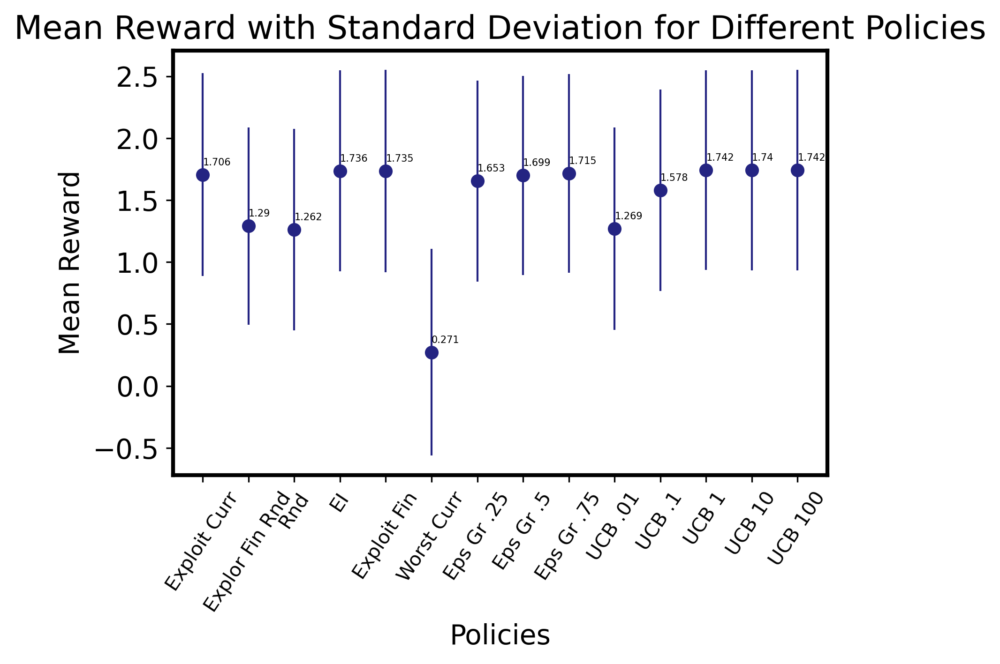

In [65]:
policy_names_ebar = ["Exploit Curr", "Explor Fin Rnd", "Rnd", "EI", "Exploit Fin", "Worst Curr", "Eps Gr .25", "Eps Gr .5", "Eps Gr .75", "UCB .01", "UCB .1", "UCB 1", "UCB 10", "UCB 100"]
means_ebar = [policy_1_means_avg,policy_2_means_avg,policy_3_means_avg,policy_4_means_avg,policy_5_means_avg,policy_6_means_avg,policy0p25_means_avg,policy0p5_means_avg,policy0p75_means_avg,policy1p01_means_avg,policy1p1_means_avg,policy2_means_avg,policy11_means_avg,policy101_means_avg]
std_devs_ebar = [policy_1_sd_avg,policy_2_sd_avg,policy_3_sd_avg,policy_4_sd_avg,policy_5_sd_avg,policy_6_sd_avg,policy0p25_sd_avg,policy0p5_sd_avg,policy0p75_sd_avg,policy1p01_sd_avg,policy1p1_sd_avg,policy2_sd_avg,policy11_sd_avg,policy101_sd_avg]

x_pos_ebar = np.arange(len(policy_names_ebar))

# plt.errorbar(x_pos_ebar, means_ebar, std_devs_ebar, marker='o', linewidth=0, elinewidth=1)
plt.errorbar(policy_names_ebar, means_ebar, std_devs_ebar, marker='o', linewidth=0, elinewidth=1)

# Add y-values as annotations to the plot
for x, y in zip(policy_names_ebar, means_ebar):
    plt.text(x, y+0.1, f'{round(y, 3)}', ha='left', va='center', fontsize=5)

plt.xticks(x_pos_ebar, policy_names_ebar, fontsize=10, rotation=56.25)
plt.xlabel('Policies')
plt.ylabel('Mean Reward')
plt.title('Mean Reward with Standard Deviation for Different Policies')
plt.show()

In [66]:
reward_data_1=np.copy(data)

data_s_1 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s_1[stage_idx, :3] = samples[:, 0]

    # (param == -1)
    I_1 = (reward_data_1[:, 0] == stage_idx) & (np.abs(reward_data_1[:, 1]+1) < 1e-6)
    data_s_1[stage_idx, 3:5] = reward_data_1[I_1, 2:]

    # Baseline (param == -2)
    I_1 = (reward_data_1[:, 0] == stage_idx) & (np.abs(reward_data_1[:, 1]+2) < 1e-6)
    data_s_1[stage_idx, 5:7] = reward_data_1[I_1, 2:]

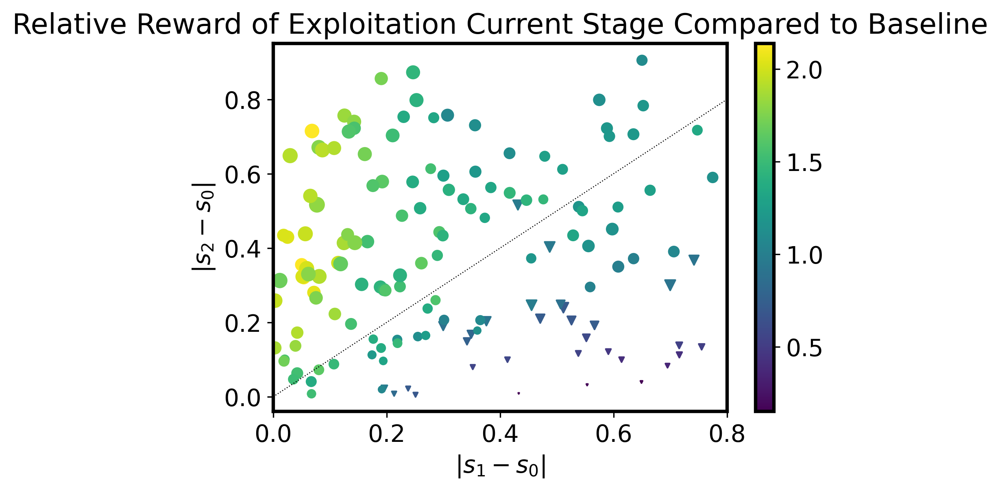

In [67]:
# Make plot of reward vs. prior features

X_1 = np.abs(data_s_1[:, 1] - data_s_1[:, 0])
Y_1 = np.abs(data_s_1[:, 2] - data_s_1[:, 0])

Z_1 = data_s_1[:, 3] / data_s_1[:, 5]
#Z_1 = data_s_1[:, 3]
#Z_1 = data_s_1[:, 5]

I_bad_1 = data_s_1[:, 3] <= data_s_1[:, 5]
I_good_1 = data_s_1[:, 3] > data_s_1[:, 5]

S_1 = (7.0*data_s_1[:, 4])**2

Z_max_1 = np.max(Z_1)
Z_min_1 = np.min(Z_1)

plt.figure(1)

plt.scatter(X_1[I_bad_1], Y_1[I_bad_1], c = Z_1[I_bad_1], vmax=Z_max_1, vmin=Z_min_1, s = S_1[I_bad_1], marker = 'v')
plt.scatter(X_1[I_good_1], Y_1[I_good_1], c = Z_1[I_good_1], vmax=Z_max_1, vmin=Z_min_1, s = S_1[I_good_1])
ylim = plt.ylim()

for i in range(len(X_1)):
    if X_1[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S_1[i] < 20:
            dy_1 = 0.02 + 2.5e-3*math.sqrt(S_1[i])
        else:
            dy_1 = 0.005
            if Z_1[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of Exploitation Current Stage Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [68]:
reward_data_3=np.copy(data)

data_s_3 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s_3[stage_idx, :3] = samples[:, 0]

    # (param == -3)
    I_3 = (reward_data_3[:, 0] == stage_idx) & (np.abs(reward_data_3[:, 1]+3) < 1e-6)
    data_s_3[stage_idx, 3:5] = reward_data_3[I_3, 2:]

    # Baseline (param == -2)
    I_3 = (reward_data_3[:, 0] == stage_idx) & (np.abs(reward_data_3[:, 1]+2) < 1e-6)
    data_s_3[stage_idx, 5:7] = reward_data_3[I_3, 2:]

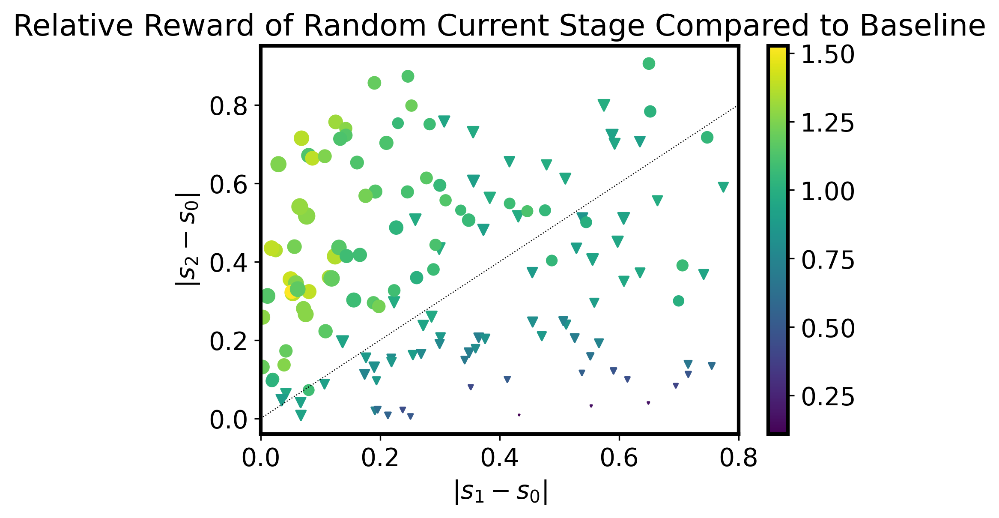

In [69]:
# Make plot of reward vs. prior features

X_3 = np.abs(data_s_3[:, 1] - data_s_3[:, 0])
Y_3 = np.abs(data_s_3[:, 2] - data_s_3[:, 0])

Z_3 = data_s_3[:, 3] / data_s_3[:, 5]
#Z_3 = data_s_3[:, 3]
#Z_3 = data_s_3[:, 5]

I_bad_3 = data_s_3[:, 3] <= data_s_3[:, 5]
I_good_3 = data_s_3[:, 3] > data_s_3[:, 5]

S_3 = (7.0*data_s_3[:, 4])**2

Z_max_3 = np.max(Z_3)
Z_min_3 = np.min(Z_3)

plt.figure(2)

plt.scatter(X_3[I_bad_3], Y_3[I_bad_3], c = Z_3[I_bad_3], vmax=Z_max_3, vmin=Z_min_3, s = S_3[I_bad_3], marker = 'v')
plt.scatter(X_3[I_good_3], Y_3[I_good_3], c = Z_3[I_good_3], vmax=Z_max_3, vmin=Z_min_3, s = S_3[I_good_3])
ylim = plt.ylim()

for i in range(len(X_3)):
    if X_3[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S_3[i] < 20:
            dy_3 = 0.02 + 2.5e-3*math.sqrt(S_3[i])
        else:
            dy_3 = 0.005
            if Z_3[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of Random Current Stage Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [70]:
reward_data_4=np.copy(data)

data_s_4 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s_4[stage_idx, :3] = samples[:, 0]

    # (param == -4)
    I_4 = (reward_data_4[:, 0] == stage_idx) & (np.abs(reward_data_4[:, 1]+4) < 1e-6)
    data_s_4[stage_idx, 3:5] = reward_data_4[I_4, 2:]

    # Baseline (param == -2)
    I_4 = (reward_data_4[:, 0] == stage_idx) & (np.abs(reward_data_4[:, 1]+2) < 1e-6)
    data_s_4[stage_idx, 5:7] = reward_data_4[I_4, 2:]

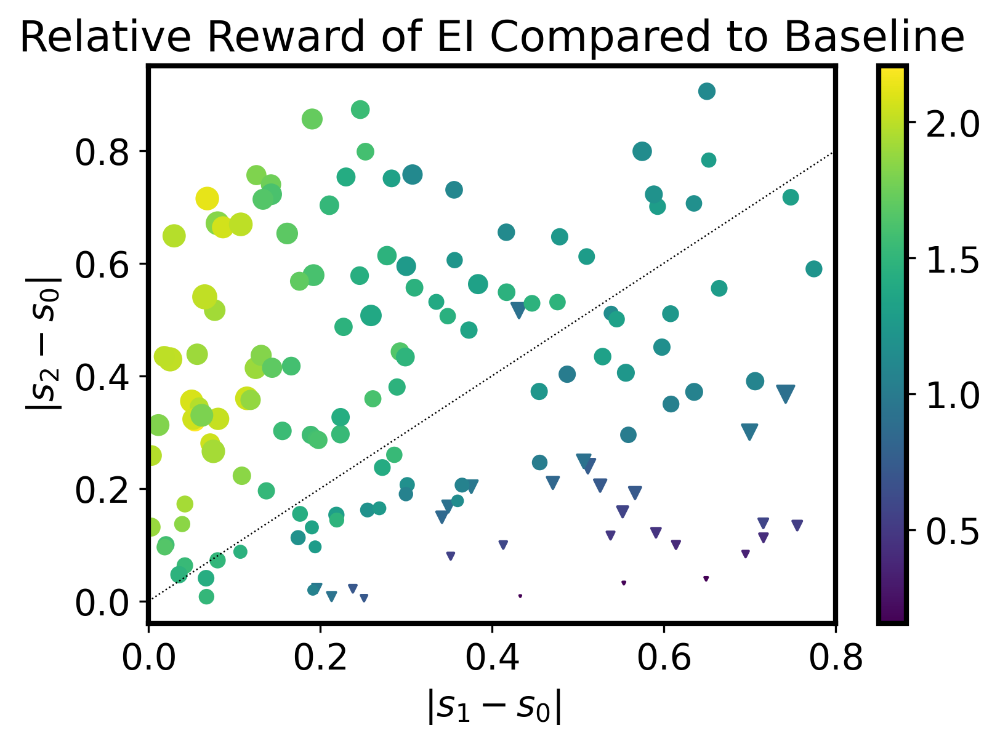

In [71]:
# Make plot of reward vs. prior features

X_4 = np.abs(data_s_4[:, 1] - data_s_4[:, 0])
Y_4 = np.abs(data_s_4[:, 2] - data_s_4[:, 0])

Z_4 = data_s_4[:, 3] / data_s_4[:, 5]
#Z_4 = data_s_4[:, 3]
#Z_4 = data_s_4[:, 5]

I_bad_4 = data_s_4[:, 3] <= data_s_4[:, 5]
I_good_4 = data_s_4[:, 3] > data_s_4[:, 5]

S_4 = (7.0*data_s_4[:, 4])**2

Z_max_4 = np.max(Z_4)
Z_min_4 = np.min(Z_4)

plt.figure(3)

plt.scatter(X_4[I_bad_4], Y_4[I_bad_4], c = Z_4[I_bad_4], vmax=Z_max_4, vmin=Z_min_4, s = S_4[I_bad_4], marker = 'v')
plt.scatter(X_4[I_good_4], Y_4[I_good_4], c = Z_4[I_good_4], vmax=Z_max_4, vmin=Z_min_4, s = S_4[I_good_4])
ylim = plt.ylim()

for i in range(len(X_4)):
    if X_4[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S_4[i] < 20:
            d_4y = 0.02 + 2.5e-3*math.sqrt(S_4[i])
        else:
            dy_4 = 0.005
            if Z_4[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of EI Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [72]:
reward_data_5=np.copy(data)

data_s_5 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s_5[stage_idx, :3] = samples[:, 0]

    # (param == -5)
    I_5 = (reward_data_5[:, 0] == stage_idx) & (np.abs(reward_data_5[:, 1]+5) < 1e-6)
    data_s_5[stage_idx, 3:5] = reward_data_5[I_5, 2:]

    # Baseline (param == -2)
    I_5 = (reward_data_5[:, 0] == stage_idx) & (np.abs(reward_data_5[:, 1]+2) < 1e-6)
    data_s_5[stage_idx, 5:7] = reward_data_5[I_5, 2:]

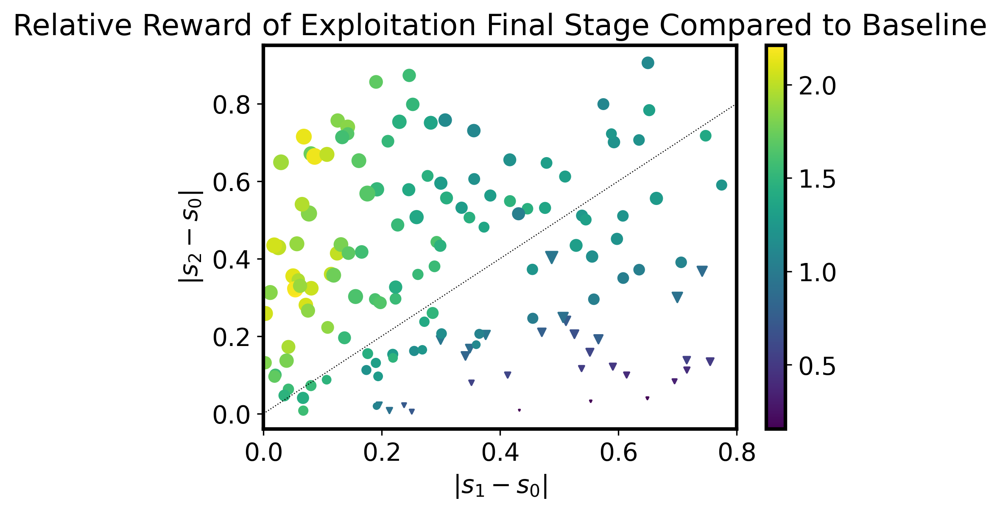

In [73]:
# Make plot of reward vs. prior features

X_5 = np.abs(data_s_5[:, 1] - data_s_5[:, 0])
Y_5 = np.abs(data_s_5[:, 2] - data_s_5[:, 0])

Z_5 = data_s_5[:, 3] / data_s_5[:, 5]
#Z_5 = data_s_5[:, 3]
#Z_5 = data_s_5[:, 5]

I_bad_5 = data_s_5[:, 3] <= data_s_5[:, 5]
I_good_5 = data_s_5[:, 3] > data_s_5[:, 5]

S_5 = (7.0*data_s_5[:, 4])**2

Z_max_5 = np.max(Z_5)
Z_min_5 = np.min(Z_5)

plt.figure(4)

plt.scatter(X_5[I_bad_5], Y_5[I_bad_5], c = Z_5[I_bad_5], vmax=Z_max_5, vmin=Z_min_5, s = S_5[I_bad_5], marker = 'v')
plt.scatter(X_5[I_good_5], Y_5[I_good_5], c = Z_5[I_good_5], vmax=Z_max_5, vmin=Z_min_5, s = S_5[I_good_5])
ylim = plt.ylim()

for i in range(len(X_5)):
    if X_5[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S_5[i] < 20:
            dy_5 = 0.02 + 2.5e-3*math.sqrt(S_5[i])
        else:
            dy_5 = 0.005
            if Z_5[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of Exploitation Final Stage Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [74]:
reward_data_6=np.copy(data)

data_s_6 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s_6[stage_idx, :3] = samples[:, 0]

    # (param == -6)
    I_6 = (reward_data_6[:, 0] == stage_idx) & (np.abs(reward_data_6[:, 1]+6) < 1e-6)
    data_s_6[stage_idx, 3:5] = reward_data_6[I_6, 2:]

    # Baseline (param == -2)
    I_6 = (reward_data_6[:, 0] == stage_idx) & (np.abs(reward_data_6[:, 1]+2) < 1e-6)
    data_s_6[stage_idx, 5:7] = reward_data_6[I_6, 2:]

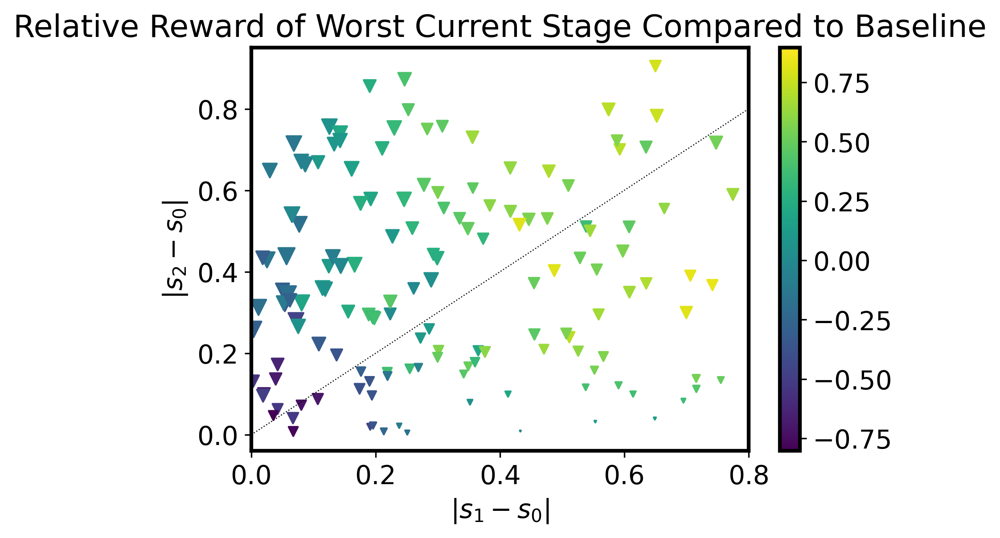

In [75]:
# Make plot of reward vs. prior features

X_6 = np.abs(data_s_6[:, 1] - data_s_6[:, 0])
Y_6 = np.abs(data_s_6[:, 2] - data_s_6[:, 0])

Z_6 = data_s_6[:, 3] / data_s_6[:, 5]
#Z_6 = data_s_6[:, 3]
#Z_6 = data_s_6[:, 5]

I_bad_6 = data_s_6[:, 3] <= data_s_6[:, 5]
I_good_6 = data_s_6[:, 3] > data_s_6[:, 5]

S_6 = (7.0*data_s_6[:, 4])**2

Z_max_6 = np.max(Z_6)
Z_min_6 = np.min(Z_6)

plt.figure(5)

plt.scatter(X_6[I_bad_6], Y_6[I_bad_6], c = Z_6[I_bad_6], vmax=Z_max_6, vmin=Z_min_6, s = S_6[I_bad_6], marker = 'v')
plt.scatter(X_6[I_good_6], Y_6[I_good_6], c = Z_6[I_good_6], vmax=Z_max_6, vmin=Z_min_6, s = S_6[I_good_6])
ylim = plt.ylim()

for i in range(len(X_6)):
    if X_6[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S_6[i] < 20:
            dy_6 = 0.02 + 2.5e-3*math.sqrt(S_6[i])
        else:
            dy_6 = 0.005
            if Z_6[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of Worst Current Stage Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [76]:
reward_data0p25=np.copy(data)

data_s0p25 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s0p25[stage_idx, :3] = samples[:, 0]

    # (param == 0.25)
    I0p25 = (reward_data0p25[:, 0] == stage_idx) & (np.abs(reward_data0p25[:, 1]-0.25) < 1e-6)
    data_s0p25[stage_idx, 3:5] = reward_data0p25[I0p25, 2:]

    # Baseline (param == -2)
    I0p25 = (reward_data0p25[:, 0] == stage_idx) & (np.abs(reward_data0p25[:, 1]+2) < 1e-6)
    data_s0p25[stage_idx, 5:7] = reward_data0p25[I0p25, 2:]

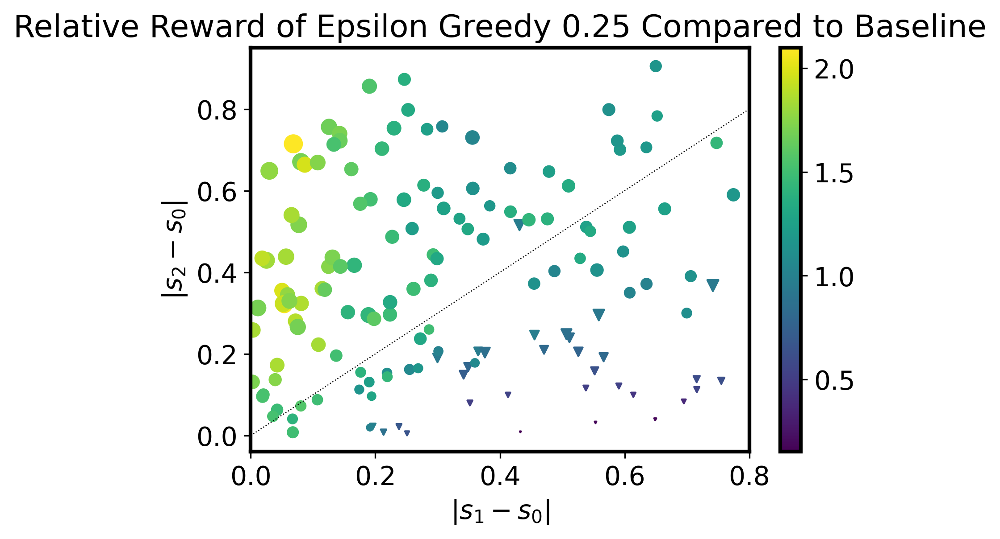

In [77]:
# Make plot of reward vs. prior features

X0p25 = np.abs(data_s0p25[:, 1] - data_s0p25[:, 0])
Y0p25 = np.abs(data_s0p25[:, 2] - data_s0p25[:, 0])

Z0p25 = data_s0p25[:, 3] / data_s0p25[:, 5]
#Z0p25 = data_s0p25[:, 3]
#Z0p25 = data_s0p25[:, 5]

I_bad0p25 = data_s0p25[:, 3] <= data_s0p25[:, 5]
I_good0p25 = data_s0p25[:, 3] > data_s0p25[:, 5]

S0p25 = (7.0*data_s0p25[:, 4])**2

Z_max0p25 = np.max(Z0p25)
Z_min0p25 = np.min(Z0p25)

plt.figure(6)

plt.scatter(X0p25[I_bad0p25], Y0p25[I_bad0p25], c = Z0p25[I_bad0p25], vmax=Z_max0p25, vmin=Z_min0p25, s = S0p25[I_bad0p25], marker = 'v')
plt.scatter(X0p25[I_good0p25], Y0p25[I_good0p25], c = Z0p25[I_good0p25], vmax=Z_max0p25, vmin=Z_min0p25, s = S0p25[I_good0p25])
ylim = plt.ylim()

for i in range(len(X0p25)):
    if X0p25[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S0p25[i] < 20:
            dy0p25 = 0.02 + 2.5e-3*math.sqrt(S0p25[i])
        else:
            dy0p25 = 0.005
            if Z0p25[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of Epsilon Greedy 0.25 Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [78]:
reward_data0p5=np.copy(data)

data_s0p5 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s0p5[stage_idx, :3] = samples[:, 0]

    # (param == 0.5)
    I0p5 = (reward_data0p5[:, 0] == stage_idx) & (np.abs(reward_data0p5[:, 1]-0.5) < 1e-6)
    data_s0p5[stage_idx, 3:5] = reward_data0p5[I0p5, 2:]

    # Baseline (param == -2)
    I0p5 = (reward_data0p5[:, 0] == stage_idx) & (np.abs(reward_data0p5[:, 1]+2) < 1e-6)
    data_s0p5[stage_idx, 5:7] = reward_data0p5[I0p5, 2:]

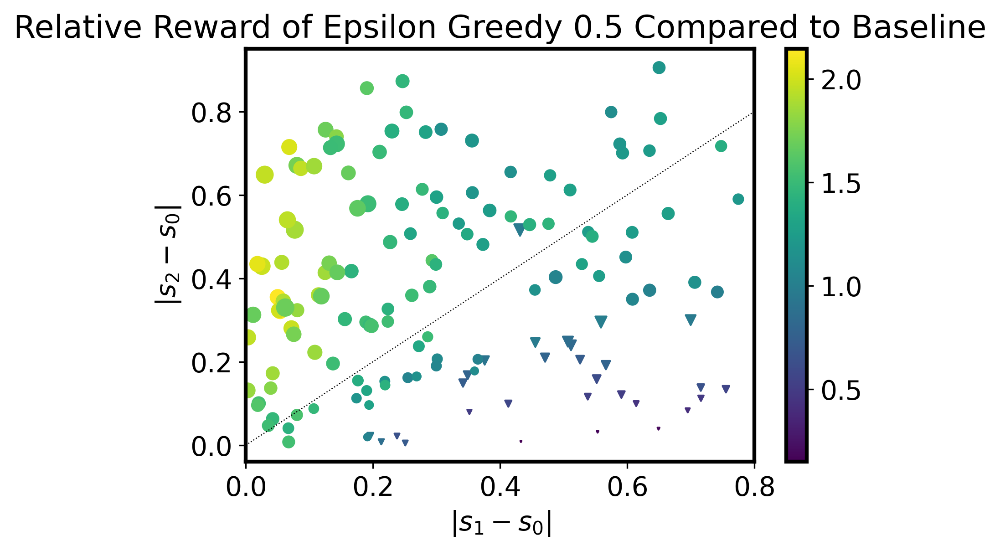

In [79]:
# Make plot of reward vs. prior features

X0p5 = np.abs(data_s0p5[:, 1] - data_s0p5[:, 0])
Y0p5 = np.abs(data_s0p5[:, 2] - data_s0p5[:, 0])

Z0p5 = data_s0p5[:, 3] / data_s0p5[:, 5]
#Z0p5 = data_s0p5[:, 3]
#Z0p5 = data_s0p5[:, 5]

I_bad0p5 = data_s0p5[:, 3] <= data_s0p5[:, 5]
I_good0p5 = data_s0p5[:, 3] > data_s0p5[:, 5]

S0p5 = (7.0*data_s0p5[:, 4])**2

Z_max0p5 = np.max(Z0p5)
Z_min0p5 = np.min(Z0p5)

plt.figure(7)

plt.scatter(X0p5[I_bad0p5], Y0p5[I_bad0p5], c = Z0p5[I_bad0p5], vmax=Z_max0p5, vmin=Z_min0p5, s = S0p5[I_bad0p5], marker = 'v')
plt.scatter(X0p5[I_good0p5], Y0p5[I_good0p5], c = Z0p5[I_good0p5], vmax=Z_max0p5, vmin=Z_min0p5, s = S0p5[I_good0p5])
ylim = plt.ylim()

for i in range(len(X0p5)):
    if X0p5[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S0p5[i] < 20:
            dy0p5 = 0.02 + 2.5e-3*math.sqrt(S0p5[i])
        else:
            dy0p5 = 0.005
            if Z0p5[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of Epsilon Greedy 0.5 Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [80]:
reward_data0p75=np.copy(data)

data_s0p75 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s0p75[stage_idx, :3] = samples[:, 0]

    # (param == 0.75)
    I0p75 = (reward_data0p75[:, 0] == stage_idx) & (np.abs(reward_data0p75[:, 1]-0.75) < 1e-6)
    data_s0p75[stage_idx, 3:5] = reward_data0p75[I0p75, 2:]

    # Baseline (param == -2)
    I0p75 = (reward_data0p75[:, 0] == stage_idx) & (np.abs(reward_data0p75[:, 1]+2) < 1e-6)
    data_s0p75[stage_idx, 5:7] = reward_data0p75[I0p75, 2:]

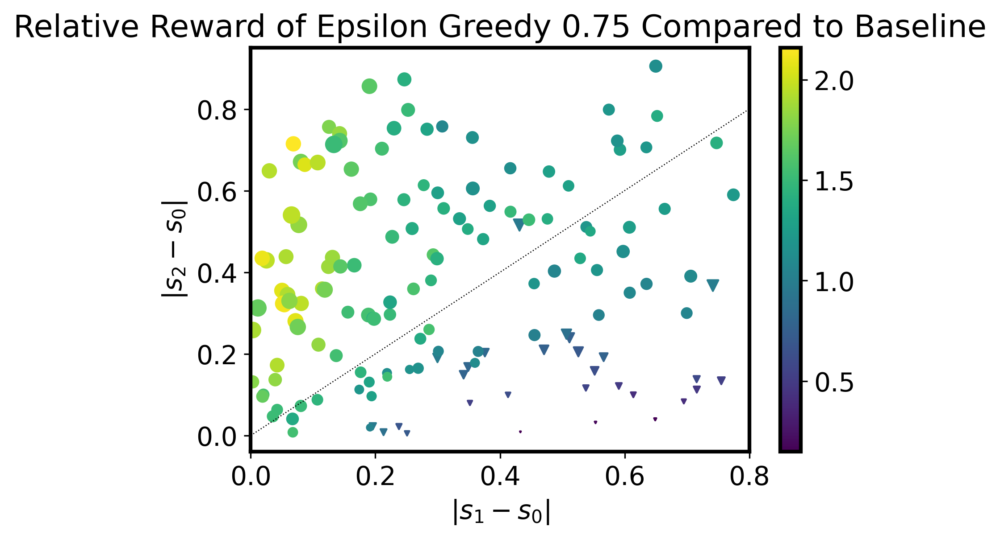

In [81]:
# Make plot of reward vs. prior features

X0p75 = np.abs(data_s0p75[:, 1] - data_s0p75[:, 0])
Y0p75 = np.abs(data_s0p75[:, 2] - data_s0p75[:, 0])

Z0p75 = data_s0p75[:, 3] / data_s0p75[:, 5]
#Z0p75 = data_s0p75[:, 3]
#Z0p75 = data_s0p75[:, 5]

I_bad0p75 = data_s0p75[:, 3] <= data_s0p75[:, 5]
I_good0p75 = data_s0p75[:, 3] > data_s0p75[:, 5]

S0p75 = (7.0*data_s0p75[:, 4])**2

Z_max0p75 = np.max(Z0p75)
Z_min0p75 = np.min(Z0p75)

plt.figure(8)

plt.scatter(X0p75[I_bad0p75], Y0p75[I_bad0p75], c = Z0p75[I_bad0p75], vmax=Z_max0p75, vmin=Z_min0p75, s = S0p75[I_bad0p75], marker = 'v')
plt.scatter(X0p75[I_good0p75], Y0p75[I_good0p75], c = Z0p75[I_good0p75], vmax=Z_max0p75, vmin=Z_min0p75, s = S0p75[I_good0p75])
ylim = plt.ylim()

for i in range(len(X0p75)):
    if X0p75[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S0p75[i] < 20:
            dy0p75 = 0.02 + 2.5e-3*math.sqrt(S0p75[i])
        else:
            dy0p75 = 0.005
            if Z0p75[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of Epsilon Greedy 0.75 Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [82]:
reward_data1p01=np.copy(data)

data_s1p01 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s1p01[stage_idx, :3] = samples[:, 0]

    # (param == 1.01)
    I1p01 = (reward_data1p01[:, 0] == stage_idx) & (np.abs(reward_data1p01[:, 1]-1.01) < 1e-6)
    data_s1p01[stage_idx, 3:5] = reward_data1p01[I1p01, 2:]

    # Baseline (param == -2)
    I1p01 = (reward_data1p01[:, 0] == stage_idx) & (np.abs(reward_data1p01[:, 1]+2) < 1e-6)
    data_s1p01[stage_idx, 5:7] = reward_data1p01[I1p01, 2:]

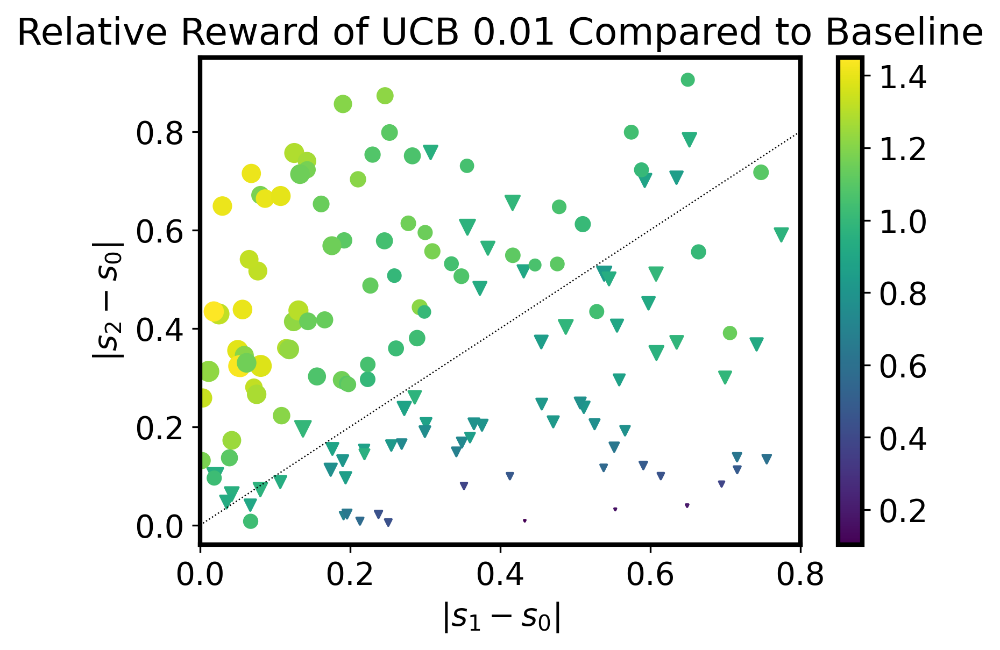

In [83]:
# Make plot of reward vs. prior features

X1p01 = np.abs(data_s1p01[:, 1] - data_s1p01[:, 0])
Y1p01 = np.abs(data_s1p01[:, 2] - data_s1p01[:, 0])

Z1p01 = data_s1p01[:, 3] / data_s1p01[:, 5]
#Z1p01 = data_s1p01[:, 3]
#Z1p01 = data_s1p01[:, 5]

I_bad1p01 = data_s1p01[:, 3] <= data_s1p01[:, 5]
I_good1p01 = data_s1p01[:, 3] > data_s1p01[:, 5]

S1p01 = (7.0*data_s1p01[:, 4])**2

Z_max1p01 = np.max(Z1p01)
Z_min1p01 = np.min(Z1p01)

plt.figure(9)

plt.scatter(X1p01[I_bad1p01], Y1p01[I_bad1p01], c = Z1p01[I_bad1p01], vmax=Z_max1p01, vmin=Z_min1p01, s = S1p01[I_bad1p01], marker = 'v')
plt.scatter(X1p01[I_good1p01], Y1p01[I_good1p01], c = Z1p01[I_good1p01], vmax=Z_max1p01, vmin=Z_min1p01, s = S1p01[I_good1p01])
ylim = plt.ylim()

for i in range(len(X1p01)):
    if X1p01[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S1p01[i] < 20:
            dy1p01 = 0.02 + 2.5e-3*math.sqrt(S1p01[i])
        else:
            dy1p01 = 0.005
            if Z1p01[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of UCB 0.01 Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [84]:
reward_data1p1=np.copy(data)

data_s1p1 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s1p1[stage_idx, :3] = samples[:, 0]

    # (param == 1.1)
    I1p1 = (reward_data1p1[:, 0] == stage_idx) & (np.abs(reward_data1p1[:, 1]-1.1) < 1e-6)
    data_s1p1[stage_idx, 3:5] = reward_data1p1[I1p1, 2:]

    # Baseline (param == -2)
    I1p1 = (reward_data1p1[:, 0] == stage_idx) & (np.abs(reward_data1p1[:, 1]+2) < 1e-6)
    data_s1p1[stage_idx, 5:7] = reward_data1p1[I1p1, 2:]

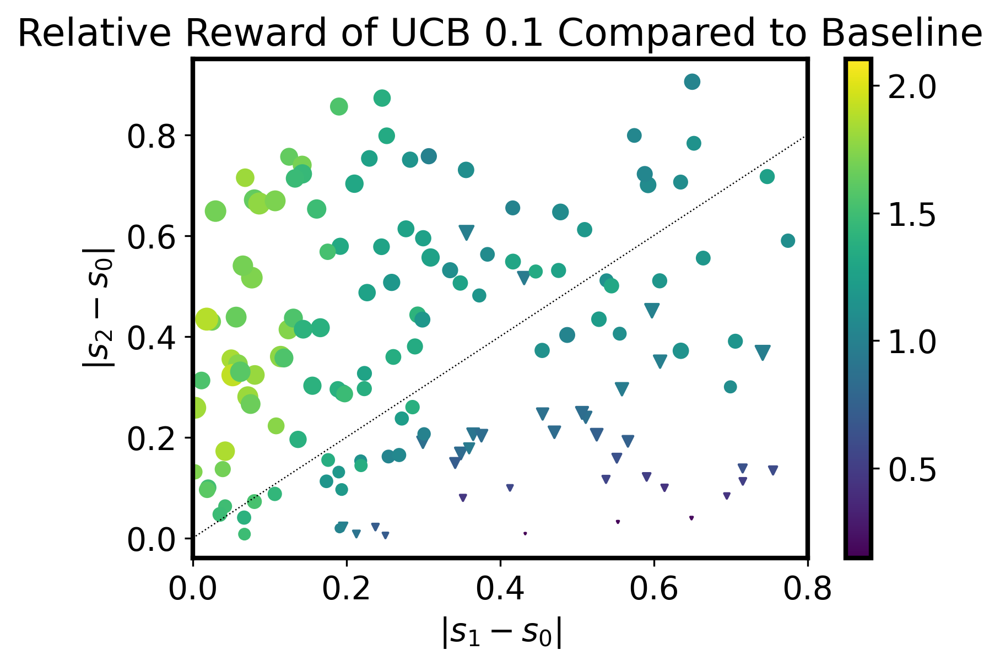

In [85]:
# Make plot of reward vs. prior features

X1p1 = np.abs(data_s1p1[:, 1] - data_s1p1[:, 0])
Y1p1 = np.abs(data_s1p1[:, 2] - data_s1p1[:, 0])

Z1p1 = data_s1p1[:, 3] / data_s1p1[:, 5]
#Z1p1 = data_s1p1[:, 3]
#Z1p1 = data_s1p1[:, 5]

I_bad1p1 = data_s1p1[:, 3] <= data_s1p1[:, 5]
I_good1p1 = data_s1p1[:, 3] > data_s1p1[:, 5]

S1p1 = (7.0*data_s1p1[:, 4])**2

Z_max1p1 = np.max(Z1p1)
Z_min1p1 = np.min(Z1p1)

plt.figure(10)

plt.scatter(X1p1[I_bad1p1], Y1p1[I_bad1p1], c = Z1p1[I_bad1p1], vmax=Z_max1p1, vmin=Z_min1p1, s = S1p1[I_bad1p1], marker = 'v')
plt.scatter(X1p1[I_good1p1], Y1p1[I_good1p1], c = Z1p1[I_good1p1], vmax=Z_max1p1, vmin=Z_min1p1, s = S1p1[I_good1p1])
ylim = plt.ylim()

for i in range(len(X1p1)):
    if X1p1[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S1p1[i] < 20:
            dy1p1 = 0.02 + 2.5e-3*math.sqrt(S1p1[i])
        else:
            dy1p1 = 0.005
            if Z1p1[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of UCB 0.1 Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [86]:
reward_data2=np.copy(data)

data_s2 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s2[stage_idx, :3] = samples[:, 0]

    # (param == 2)
    I2 = (reward_data2[:, 0] == stage_idx) & (np.abs(reward_data2[:, 1]-2) < 1e-6)
    data_s2[stage_idx, 3:5] = reward_data2[I2, 2:]

    # Baseline (param == -2)
    I2 = (reward_data2[:, 0] == stage_idx) & (np.abs(reward_data2[:, 1]+2) < 1e-6)
    data_s2[stage_idx, 5:7] = reward_data2[I2, 2:]

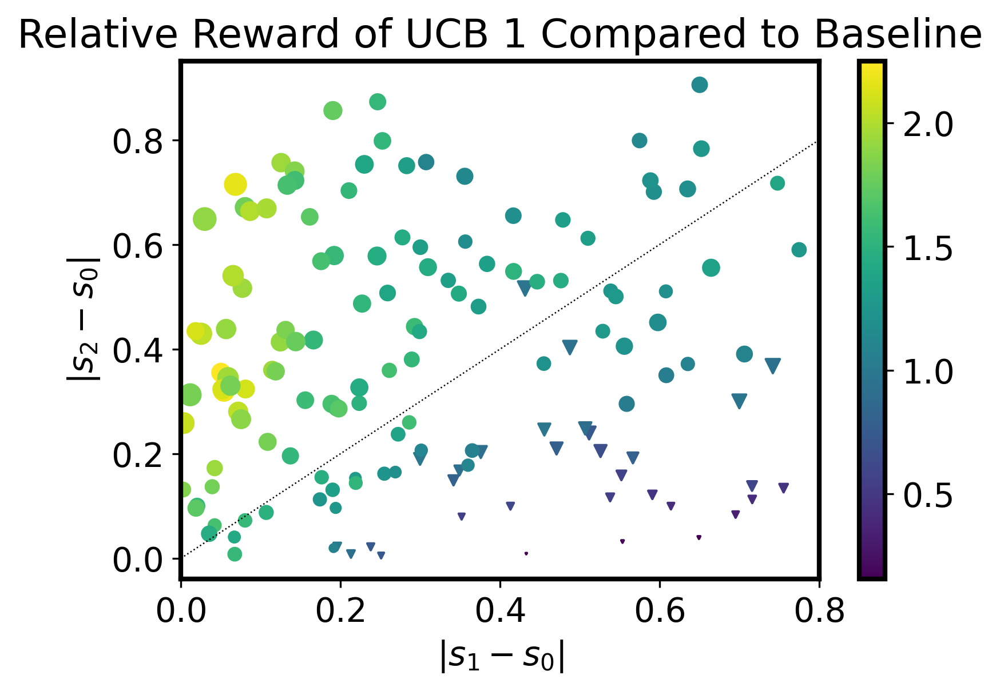

In [87]:
# Make plot of reward vs. prior features

X2 = np.abs(data_s2[:, 1] - data_s2[:, 0])
Y2 = np.abs(data_s2[:, 2] - data_s2[:, 0])

Z2 = data_s2[:, 3] / data_s2[:, 5]
#Z2 = data_s2[:, 3]
#Z2 = data_s2[:, 5]

I_bad2 = data_s2[:, 3] <= data_s2[:, 5]
I_good2 = data_s2[:, 3] > data_s2[:, 5]

S2 = (7.0*data_s2[:, 4])**2

Z_max2 = np.max(Z2)
Z_min2 = np.min(Z2)

plt.figure(11)

plt.scatter(X2[I_bad2], Y2[I_bad2], c = Z2[I_bad2], vmax=Z_max2, vmin=Z_min2, s = S2[I_bad2], marker = 'v')
plt.scatter(X2[I_good2], Y2[I_good2], c = Z2[I_good2], vmax=Z_max2, vmin=Z_min2, s = S2[I_good2])
ylim = plt.ylim()

for i in range(len(X2)):
    if X2[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S2[i] < 20:
            dy2 = 0.02 + 2.5e-3*math.sqrt(S2[i])
        else:
            dy2 = 0.005
            if Z2[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of UCB 1 Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [88]:
reward_data11=np.copy(data)

data_s11 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s11[stage_idx, :3] = samples[:, 0]

    # (param == 11)
    I11 = (reward_data11[:, 0] == stage_idx) & (np.abs(reward_data11[:, 1]-11) < 1e-6)
    data_s11[stage_idx, 3:5] = reward_data11[I11, 2:]

    # Baseline (param == -2)
    I11 = (reward_data11[:, 0] == stage_idx) & (np.abs(reward_data11[:, 1]+2) < 1e-6)
    data_s11[stage_idx, 5:7] = reward_data11[I11, 2:]

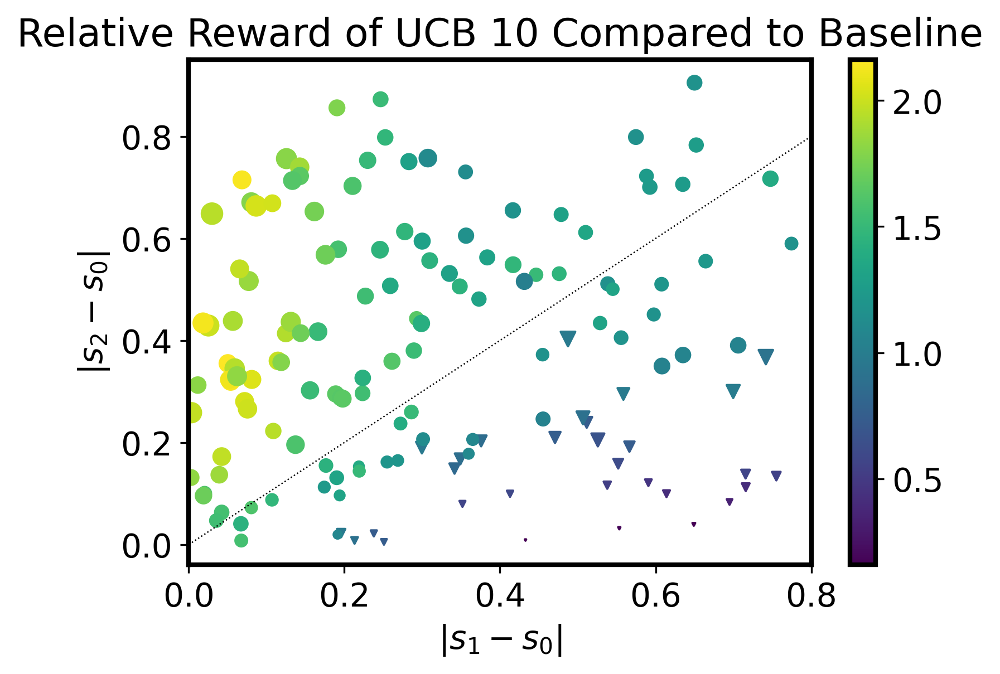

In [89]:
# Make plot of reward vs. prior features

X11 = np.abs(data_s11[:, 1] - data_s11[:, 0])
Y11 = np.abs(data_s11[:, 2] - data_s11[:, 0])

Z11 = data_s11[:, 3] / data_s11[:, 5]
#Z11 = data_s11[:, 3]
#Z11 = data_s11[:, 5]

I_bad11 = data_s11[:, 3] <= data_s11[:, 5]
I_good11 = data_s11[:, 3] > data_s11[:, 5]

S11 = (7.0*data_s11[:, 4])**2

Z_max11 = np.max(Z11)
Z_min11 = np.min(Z11)

plt.figure(12)

plt.scatter(X11[I_bad11], Y11[I_bad11], c = Z11[I_bad11], vmax=Z_max11, vmin=Z_min11, s = S11[I_bad11], marker = 'v')
plt.scatter(X11[I_good11], Y11[I_good11], c = Z11[I_good11], vmax=Z_max11, vmin=Z_min11, s = S11[I_good11])
ylim = plt.ylim()

for i in range(len(X11)):
    if X11[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S11[i] < 20:
            dy11 = 0.02 + 2.5e-3*math.sqrt(S11[i])
        else:
            dy11 = 0.005
            if Z11[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of UCB 10 Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

In [90]:
reward_data101=np.copy(data)

data_s101 = np.zeros([150, 7])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_s101[stage_idx, :3] = samples[:, 0]

    # (param == 101)
    I101 = (reward_data101[:, 0] == stage_idx) & (np.abs(reward_data101[:, 1]-101) < 1e-6)
    data_s101[stage_idx, 3:5] = reward_data101[I101, 2:]

    # Baseline (param == -2)
    I101 = (reward_data101[:, 0] == stage_idx) & (np.abs(reward_data101[:, 1]+2) < 1e-6)
    data_s101[stage_idx, 5:7] = reward_data101[I101, 2:]

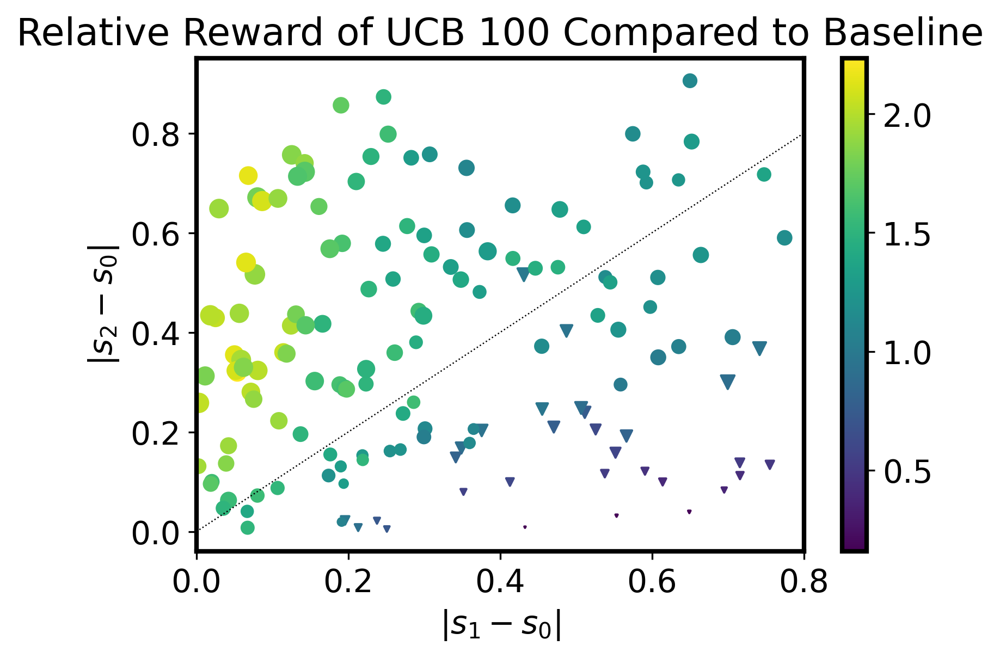

In [91]:
# Make plot of reward vs. prior features

X101 = np.abs(data_s101[:, 1] - data_s101[:, 0])
Y101 = np.abs(data_s101[:, 2] - data_s101[:, 0])

Z101 = data_s101[:, 3] / data_s101[:, 5]
#Z101 = data_s101[:, 3]
#Z101 = data_s101[:, 5]

I_bad101 = data_s101[:, 3] <= data_s101[:, 5]
I_good101 = data_s101[:, 3] > data_s101[:, 5]

S101 = (7.0*data_s101[:, 4])**2

Z_max101 = np.max(Z101)
Z_min101 = np.min(Z101)

plt.figure(13)

plt.scatter(X101[I_bad101], Y101[I_bad101], c = Z101[I_bad101], vmax=Z_max101, vmin=Z_min101, s = S101[I_bad101], marker = 'v')
plt.scatter(X101[I_good101], Y101[I_good101], c = Z101[I_good101], vmax=Z_max101, vmin=Z_min101, s = S101[I_good101])
ylim = plt.ylim()

for i in range(len(X101)):
    if X101[i] < 0.8:
        kwargs ={'fontsize': 4}
        if S101[i] < 20:
            dy101 = 0.02 + 2.5e-3*math.sqrt(S101[i])
        else:
            dy101 = 0.005
            if Z101[i] < 1:
                kwargs['color'] = 'w'
        #plt.text(X[i]-0.007, Y[i]-dy, "%02d"%i, **kwargs)

xx = np.linspace(0, 0.8, 10)
plt.plot(xx, xx, color = 'k', linewidth=0.6, linestyle=':')

plt.ylim(ylim)
plt.xlim([0, 0.8])

plt.xlabel(r'$\left|s_1 - s_0\right|$')
plt.ylabel(r'$\left|s_2 - s_0\right|$')
plt.colorbar()

plt.title('Relative Reward of UCB 100 Compared to Baseline')

# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.png"%FIGURES_DIR)
# plt.savefig("%s/stage_samples_length_scales_vs_reward_raw_random.pdf"%FIGURES_DIR)

plt.show()

First quick impression:

Whenever s1 and s2 are very close, both exploitations, all three epsilons, EI, and UCB 1,10,100 get relatively high rewards (tends to be better when s1 and s3 are far).

UCB performs fairly well in the area of the plot where s1 and s2 are very close while s1 and s3 are mid-distance apart.

The bottom right corner appears to perform poorly for all policies when compared to the baseline. That's because in that area the samples are fcc (more about this in the next section) and the baseline performs better than the other policies in these cases of fcc (again, more explanation provided in the next section).

In [92]:
reward_data_new=np.copy(data)

data_new = np.zeros([150, 3])
for stage_idx in range(150):
    # load stage samples
    samples = _load_samples(stage_idx, "stage", BASE_PARAMS['ns'],
                            BASE_PARAMS['ds'], SAMPLES_DIR)
    data_new[stage_idx, :3] = samples[:, 0]

In [93]:
data_new

array([[8.45623903e-01, 4.72680231e-01, 3.64466956e-01],
       [6.53562248e-01, 4.62303446e-01, 6.34064260e-01],
       [4.36180171e-01, 9.06869419e-01, 2.26287349e-01],
       [6.50460062e-01, 9.51590168e-01, 4.43850334e-01],
       [4.23576851e-01, 4.73772697e-01, 7.78588276e-01],
       [5.55279069e-01, 5.52327483e-01, 4.23896737e-01],
       [9.45360107e-01, 2.95340551e-01, 4.02820904e-02],
       [1.43116320e-01, 1.22837688e-01, 4.29821685e-02],
       [1.85299078e-01, 4.31034231e-01, 7.63085205e-01],
       [6.34657600e-01, 6.76955315e-01, 5.71522848e-01],
       [2.92691122e-02, 2.81775754e-01, 8.27158108e-01],
       [5.90371619e-01, 4.75852338e-01, 9.50396535e-01],
       [8.63421792e-01, 7.37871492e-01, 1.07147835e-01],
       [5.40243621e-01, 1.16150855e-02, 1.06154125e-01],
       [1.20825158e-01, 2.01212656e-01, 1.93239880e-01],
       [4.91339335e-01, 3.96455829e-03, 8.94162754e-01],
       [3.51873827e-01, 9.42595659e-01, 2.30595625e-01],
       [1.61646232e-01, 3.53702

In [94]:
data_new.shape

(150, 3)

In [95]:
# all close
s_ccc_ind = []
# s1 close s2, s1 close s3, s2 far s3
s_ccf_ind = []
s_cfc_ind = []
s_fcc_ind = []
s_cff_ind = []
s_fcf_ind = []
s_ffc_ind = []
#all far
s_fff_ind = []

cnt_s=-1
for i in data_new:
    cnt_s+=1
    if np.abs(i[0]-i[1]<0.3) & np.abs(i[0]-i[2]<0.3) & np.abs(i[1]-i[2]<0.3):
        s_ccc_ind.append(cnt_s)
    elif np.abs(i[0]-i[1]<0.3) & np.abs(i[0]-i[2]<0.3) & np.abs(i[1]-i[2]>0.3):
        s_ccf_ind.append(cnt_s)
    elif np.abs(i[0]-i[1]<0.3) & np.abs(i[0]-i[2]>0.3) & np.abs(i[1]-i[2]<0.3):
        s_cfc_ind.append(cnt_s)
    elif np.abs(i[0]-i[1]>0.3) & np.abs(i[0]-i[2]<0.3) & np.abs(i[1]-i[2]<0.3):
        s_fcc_ind.append(cnt_s)
    elif np.abs(i[0]-i[1]<0.3) & np.abs(i[0]-i[2]>0.3) & np.abs(i[1]-i[2]>0.3):
        s_cff_ind.append(cnt_s)
    elif np.abs(i[0]-i[1]>0.3) & np.abs(i[0]-i[2]<0.3) & np.abs(i[1]-i[2]>0.3):
        s_fcf_ind.append(cnt_s)
    elif np.abs(i[0]-i[1]>0.3) & np.abs(i[0]-i[2]>0.3) & np.abs(i[1]-i[2]<0.3):
        s_ffc_ind.append(cnt_s)
    elif np.abs(i[0]-i[1]>0.3) & np.abs(i[0]-i[2]>0.3) & np.abs(i[1]-i[2]>0.3):
        s_fff_ind.append(cnt_s)



In [96]:
indices_column = reward_data_new[:,0]

In [97]:
matching_indices_ccc = np.in1d(indices_column, s_ccc_ind)

data_ccc = reward_data_new[matching_indices_ccc]

data_ccc_len = len(data_ccc)
print(data_ccc_len)
print(data_ccc)

1106
[[ 1.         -2.          1.19773886  0.87468844]
 [ 1.         -3.          0.87215144  0.56049397]
 [ 1.         -4.          1.27865855  0.47580011]
 ...
 [98.          0.75        1.4085679   0.56923758]
 [99.          0.25        1.75696986  0.8360884 ]
 [99.          0.75        1.83774592  0.77084842]]


In [98]:
matching_indices_ccf = np.in1d(indices_column, s_ccf_ind)

data_ccf = reward_data_new[matching_indices_ccf]

data_ccf_len = len(data_ccf)
print(data_ccf_len)
print(data_ccf)

252
[[ 2.         -2.          1.27363617  0.79592583]
 [ 2.         -3.          1.10668574  0.66482532]
 [ 2.         -4.          1.0716707   0.64766375]
 ...
 [90.          0.75        0.54548235  0.38568395]
 [94.          0.25        0.22176659  0.13116347]
 [94.          0.75        0.22554825  0.13090583]]


In [99]:
matching_indices_cfc = np.in1d(indices_column, s_cfc_ind)

data_cfc = reward_data_new[matching_indices_cfc]

data_cfc_len = len(data_cfc)
print(data_cfc_len)
print(data_cfc)

42
[[ 1.43000000e+02 -2.00000000e+00  1.39425807e+00  8.94755211e-01]
 [ 1.43000000e+02 -3.00000000e+00  1.51393487e+00  9.78868692e-01]
 [ 1.43000000e+02 -4.00000000e+00  2.37247914e+00  9.81652794e-01]
 [ 1.43000000e+02 -5.00000000e+00  2.35545710e+00  9.58939569e-01]
 [ 1.43000000e+02 -6.00000000e+00 -1.68080840e-02  1.09273065e+00]
 [ 7.70000000e+01 -2.00000000e+00  1.30150382e+00  8.37669381e-01]
 [ 7.70000000e+01 -3.00000000e+00  1.40210014e+00  8.59706048e-01]
 [ 7.70000000e+01 -4.00000000e+00  1.92229720e+00  8.18702772e-01]
 [ 7.70000000e+01 -5.00000000e+00  2.01510570e+00  8.05840655e-01]
 [ 7.70000000e+01 -6.00000000e+00  5.32631578e-02  1.05215731e+00]
 [ 8.60000000e+01 -2.00000000e+00  1.36127539e+00  8.21864543e-01]
 [ 8.60000000e+01 -3.00000000e+00  1.32950263e+00  8.59450320e-01]
 [ 8.60000000e+01 -4.00000000e+00  1.88262026e+00  1.05227160e+00]
 [ 8.60000000e+01 -5.00000000e+00  1.87575704e+00  1.00645395e+00]
 [ 8.60000000e+01 -6.00000000e+00  4.12723935e-01  9.142162

In [100]:
matching_indices_fcc = np.in1d(indices_column, s_fcc_ind)

data_fcc = reward_data_new[matching_indices_fcc]

data_fcc_len = len(data_fcc)
print(data_fcc_len)
print(data_fcc)

140
[[ 1.05000000e+02 -2.00000000e+00  1.28199137e+00  9.04755217e-01]
 [ 1.05000000e+02 -3.00000000e+00  6.87716956e-01  3.81635851e-01]
 [ 1.05000000e+02 -4.00000000e+00  6.24414049e-01  4.14979665e-01]
 [ 1.05000000e+02 -5.00000000e+00  6.81870563e-01  4.38385923e-01]
 [ 1.05000000e+02 -6.00000000e+00  5.09383227e-01  4.54362718e-01]
 [ 1.34000000e+02 -2.00000000e+00  1.24675540e+00  6.64037743e-01]
 [ 1.34000000e+02 -3.00000000e+00  6.46192681e-01  4.35407849e-01]
 [ 1.34000000e+02 -4.00000000e+00  7.40123582e-01  3.94592030e-01]
 [ 1.34000000e+02 -5.00000000e+00  7.32256702e-01  4.44227320e-01]
 [ 1.34000000e+02 -6.00000000e+00  2.62326762e-01  4.18286114e-01]
 [ 1.50000000e+01 -2.00000000e+00  1.22465481e+00  7.91845855e-01]
 [ 1.50000000e+01 -3.00000000e+00  1.28176467e+00  7.92239823e-01]
 [ 1.50000000e+01 -4.00000000e+00  1.23535246e+00  8.21464618e-01]
 [ 1.50000000e+01 -5.00000000e+00  1.18066669e+00  9.34079302e-01]
 [ 1.50000000e+01 -6.00000000e+00  9.96083481e-01  8.55154

In [101]:
matching_indices_cff = np.in1d(indices_column, s_cff_ind)

data_cff = reward_data_new[matching_indices_cff]

data_cff_len = len(data_cff)
print(data_cff_len)
print(data_cff)

210
[[ 1.02000000e+02 -2.00000000e+00  1.30652147e+00  7.96172549e-01]
 [ 1.02000000e+02 -3.00000000e+00  1.54729895e+00  1.17125234e+00]
 [ 1.02000000e+02 -4.00000000e+00  2.44772561e+00  9.90884730e-01]
 [ 1.02000000e+02 -5.00000000e+00  2.29702350e+00  1.06165291e+00]
 [ 1.02000000e+02 -6.00000000e+00  8.41423564e-02  1.05010229e+00]
 [ 1.10000000e+02 -2.00000000e+00  1.45858133e+00  7.82382280e-01]
 [ 1.10000000e+02 -3.00000000e+00  1.64168608e+00  9.90702522e-01]
 [ 1.10000000e+02 -4.00000000e+00  2.41524407e+00  1.02290262e+00]
 [ 1.10000000e+02 -5.00000000e+00  2.31398627e+00  9.98394683e-01]
 [ 1.10000000e+02 -6.00000000e+00  1.36831759e-01  1.00328521e+00]
 [ 1.11000000e+02 -2.00000000e+00  1.28111229e+00  7.81169975e-01]
 [ 1.11000000e+02 -3.00000000e+00  1.25355978e+00  8.58147195e-01]
 [ 1.11000000e+02 -4.00000000e+00  1.18140052e+00  8.22641826e-01]
 [ 1.11000000e+02 -5.00000000e+00  1.32389145e+00  9.17214333e-01]
 [ 1.11000000e+02 -6.00000000e+00  1.03339847e+00  9.14382

In [102]:
matching_indices_fcf = np.in1d(indices_column, s_fcf_ind)

data_fcf = reward_data_new[matching_indices_fcf]

data_fcf_len = len(data_fcf)
print(data_fcf_len)
print(data_fcf)

0
[]


In [103]:
matching_indices_ffc = np.in1d(indices_column, s_ffc_ind)

data_ffc = reward_data_new[matching_indices_ffc]

data_ffc_len = len(data_ffc)
print(data_ffc_len)
print(data_ffc)

350
[[ 0.         -2.          1.36537747  0.8013098 ]
 [ 0.         -3.          1.23718524  0.84407494]
 [ 0.         -4.          1.85242417  0.82221009]
 ...
 [91.          0.75        1.77814406  0.82514533]
 [96.          0.25        1.59785668  0.8267546 ]
 [96.          0.75        1.73658369  0.78157399]]


In [104]:
matching_indices_fff = np.in1d(indices_column, s_fff_ind)

data_fff = reward_data_new[matching_indices_fff]

data_fff_len = len(data_fff)
print(data_fff_len)
print(data_fff)

0
[]


In [105]:
# here we only use 6 out of the 8 structures since two of them don't exist
structures = [data_ccc,data_ccf,data_cfc,data_fcc,data_cff,data_ffc]
structure_names = ['ccc','ccf','cfc','fcc','cff','ffc']
policies = [-1, -2, -3, -4, -5, -6, 0.25, 0.5, 0.75, 1.01, 1.1, 2, 11, 101]
policy_names_ebar = ["Exploit Curr", "Explor Fin Rnd", "Rnd", "EI", "Exploit Fin", "Worst Curr", "Eps Gr .25", "Eps Gr .5", "Eps Gr .75", "UCB .01", "UCB .1", "UCB 1", "UCB 10", "UCB 100"]
x_pos_ebar = np.arange(len(policy_names_ebar))

Amount for structure ccc and policy -1: 79
Amount for structure ccc and policy -2: 79
Amount for structure ccc and policy -3: 79
Amount for structure ccc and policy -4: 79
Amount for structure ccc and policy -5: 79
Amount for structure ccc and policy -6: 79
Amount for structure ccc and policy 0.25: 79
Amount for structure ccc and policy 0.5: 79
Amount for structure ccc and policy 0.75: 79
Amount for structure ccc and policy 1.01: 79
Amount for structure ccc and policy 1.1: 79
Amount for structure ccc and policy 2: 79
Amount for structure ccc and policy 11: 79
Amount for structure ccc and policy 101: 79


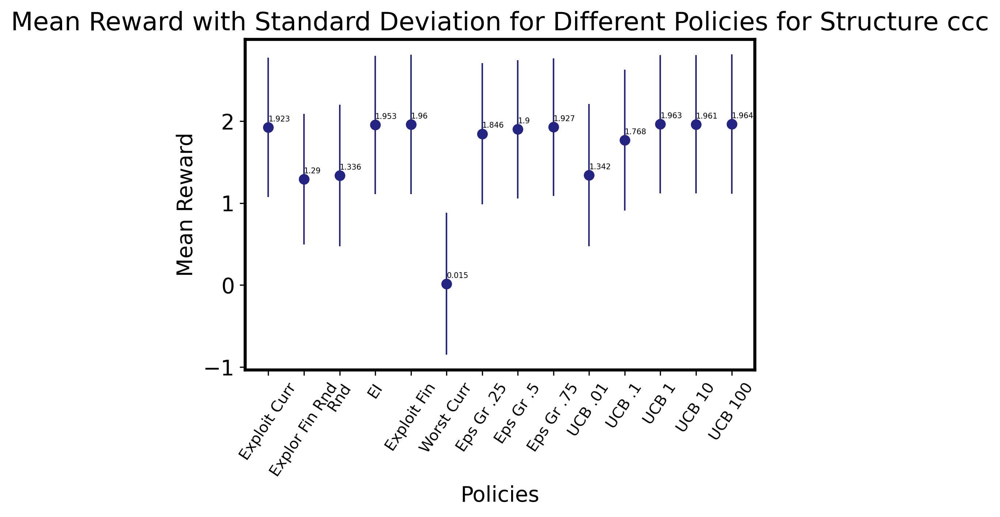

Amount for structure ccf and policy -1: 18
Amount for structure ccf and policy -2: 18
Amount for structure ccf and policy -3: 18
Amount for structure ccf and policy -4: 18
Amount for structure ccf and policy -5: 18
Amount for structure ccf and policy -6: 18
Amount for structure ccf and policy 0.25: 18
Amount for structure ccf and policy 0.5: 18
Amount for structure ccf and policy 0.75: 18
Amount for structure ccf and policy 1.01: 18
Amount for structure ccf and policy 1.1: 18
Amount for structure ccf and policy 2: 18
Amount for structure ccf and policy 11: 18
Amount for structure ccf and policy 101: 18


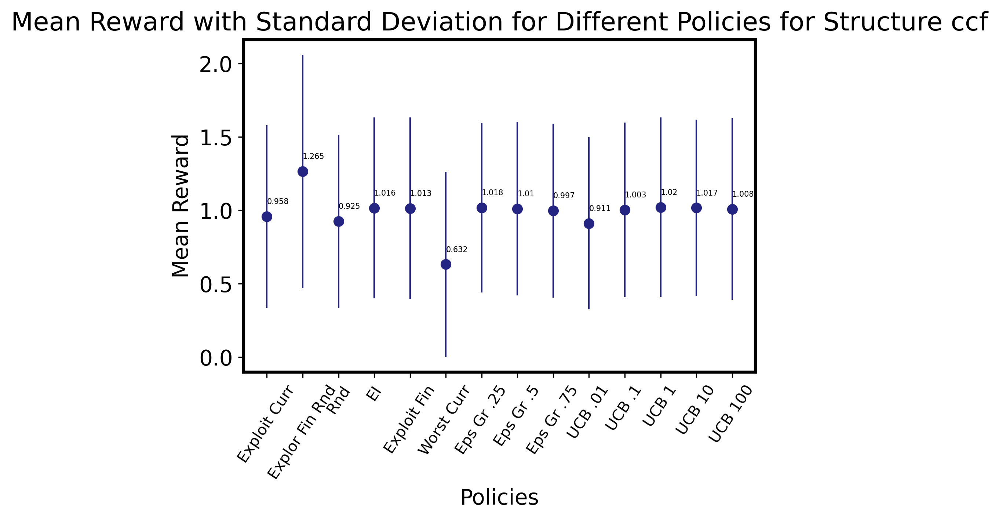

Amount for structure cfc and policy -1: 3
Amount for structure cfc and policy -2: 3
Amount for structure cfc and policy -3: 3
Amount for structure cfc and policy -4: 3
Amount for structure cfc and policy -5: 3
Amount for structure cfc and policy -6: 3
Amount for structure cfc and policy 0.25: 3
Amount for structure cfc and policy 0.5: 3
Amount for structure cfc and policy 0.75: 3
Amount for structure cfc and policy 1.01: 3
Amount for structure cfc and policy 1.1: 3
Amount for structure cfc and policy 2: 3
Amount for structure cfc and policy 11: 3
Amount for structure cfc and policy 101: 3


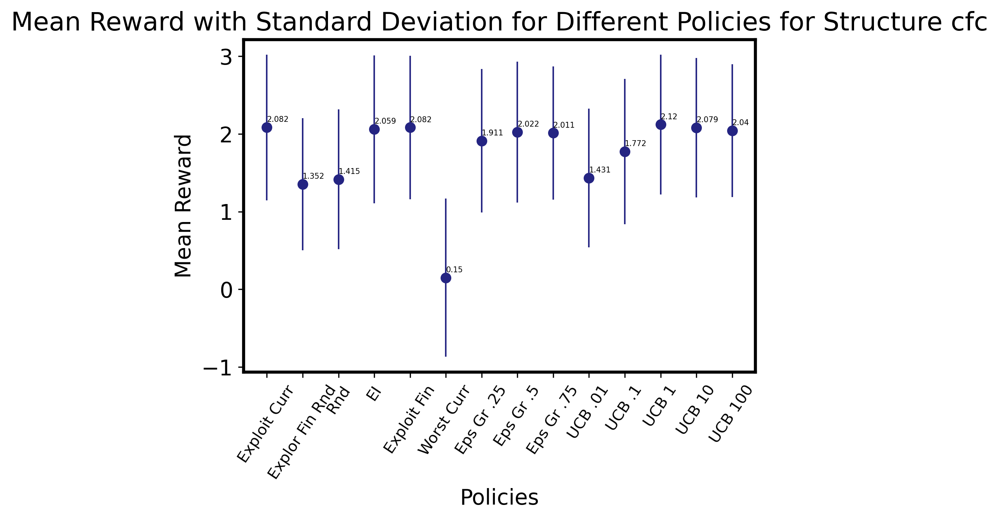

Amount for structure fcc and policy -1: 10
Amount for structure fcc and policy -2: 10
Amount for structure fcc and policy -3: 10
Amount for structure fcc and policy -4: 10
Amount for structure fcc and policy -5: 10
Amount for structure fcc and policy -6: 10
Amount for structure fcc and policy 0.25: 10
Amount for structure fcc and policy 0.5: 10
Amount for structure fcc and policy 0.75: 10
Amount for structure fcc and policy 1.01: 10
Amount for structure fcc and policy 1.1: 10
Amount for structure fcc and policy 2: 10
Amount for structure fcc and policy 11: 10
Amount for structure fcc and policy 101: 10


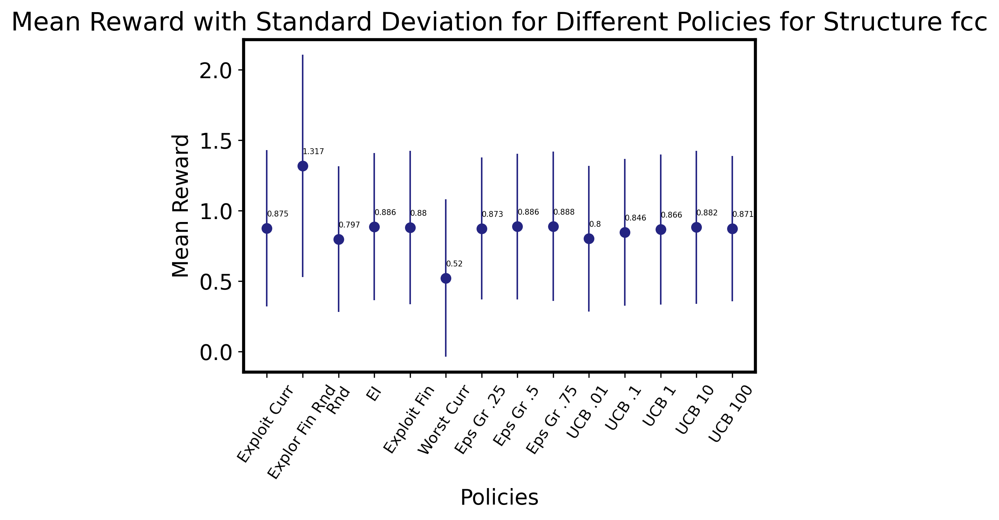

Amount for structure cff and policy -1: 15
Amount for structure cff and policy -2: 15
Amount for structure cff and policy -3: 15
Amount for structure cff and policy -4: 15
Amount for structure cff and policy -5: 15
Amount for structure cff and policy -6: 15
Amount for structure cff and policy 0.25: 15
Amount for structure cff and policy 0.5: 15
Amount for structure cff and policy 0.75: 15
Amount for structure cff and policy 1.01: 15
Amount for structure cff and policy 1.1: 15
Amount for structure cff and policy 2: 15
Amount for structure cff and policy 11: 15
Amount for structure cff and policy 101: 15


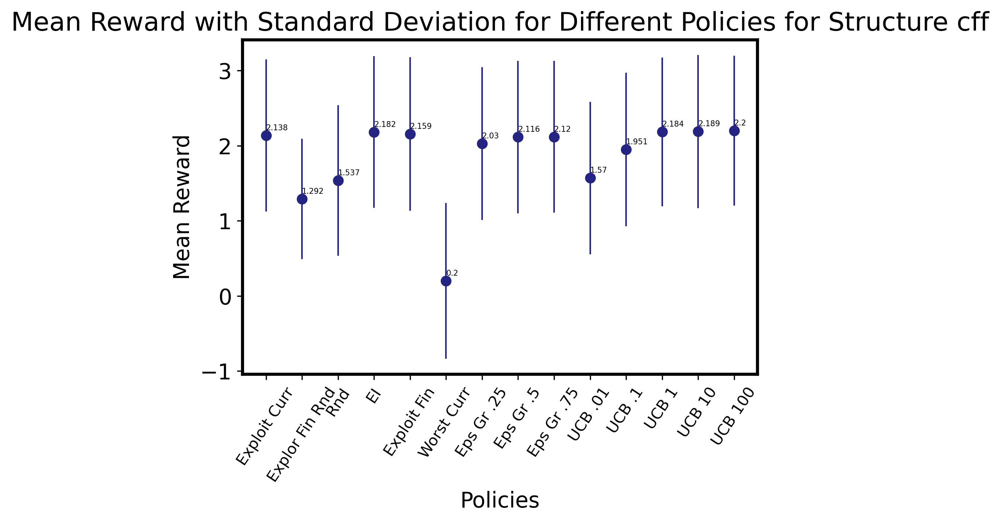

Amount for structure ffc and policy -1: 25
Amount for structure ffc and policy -2: 25
Amount for structure ffc and policy -3: 25
Amount for structure ffc and policy -4: 25
Amount for structure ffc and policy -5: 25
Amount for structure ffc and policy -6: 25
Amount for structure ffc and policy 0.25: 25
Amount for structure ffc and policy 0.5: 25
Amount for structure ffc and policy 0.75: 25
Amount for structure ffc and policy 1.01: 25
Amount for structure ffc and policy 1.1: 25
Amount for structure ffc and policy 2: 25
Amount for structure ffc and policy 11: 25
Amount for structure ffc and policy 101: 25


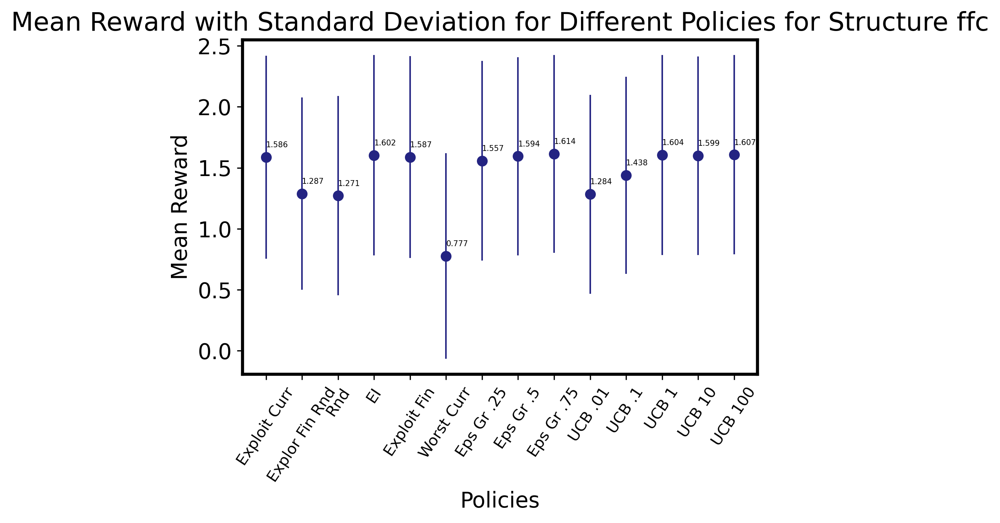

In [106]:
cnt_struc = -1

for structure in structures:
    
    cnt_struc += 1
    curr_struc = structure_names[cnt_struc]
    
    means_ebar = []
    std_devs_ebar = []
    
    for policy in policies:
    
        # ignore the specific name of the variables (policy 2 and ccc) - this combination will only happen once;
        # moreover, the names of variables here are arbitrary and will be forgotten and re-initialized at every iteration within the foor loop
        
        policy_2_ccc = [i for i in structure if i[1]==policy]
        policy_2_ccc_len = len(policy_2_ccc)
        print(f"Amount for structure {curr_struc} and policy {policy}: {policy_2_ccc_len}")

        policy_2_ccc_means = [i[2] for i in policy_2_ccc]
        policy_2_ccc_means_avg = mean(policy_2_ccc_means)
        #print(policy_2_ccc_means_avg)
        means_ebar.append(policy_2_ccc_means_avg)

        policy_2_ccc_sd = [i[3] for i in policy_2_ccc]
        policy_2_ccc_sd_avg = mean(policy_2_ccc_sd)
        #print(policy_2_ccc_sd_avg)
        std_devs_ebar.append(policy_2_ccc_sd_avg)

    # plt.errorbar(x_pos_ebar, means_ebar, std_devs_ebar, marker='o', linewidth=0, elinewidth=1)
    plt.errorbar(policy_names_ebar, means_ebar, std_devs_ebar, marker='o', linewidth=0, elinewidth=1)

    # Add y-values as annotations to the plot
    for x, y in zip(policy_names_ebar, means_ebar):
        plt.text(x, y+0.1, f'{round(y, 3)}', ha='left', va='center', fontsize=5)

    plt.xticks(x_pos_ebar, policy_names_ebar, fontsize=10, rotation=56.25)
    plt.xlabel('Policies')
    plt.ylabel('Mean Reward')
    plt.title(f'Mean Reward with Standard Deviation for Different Policies for Structure {curr_struc}')
    plt.show()
    

fcc and ccf have a similarly shaped distribution (interestingly enough, explore fin rnd (the baseline) performs the best)

ccc, cfc, cff, ffc have a similarly shaped distribution

No data for fcf or fff

In addition, it makes sense that the distribution of all the simulations is more similar to that of ccc, cfc, cff, ffc because there are more samples of those compared to fcc and ccf

The plot with circles and triangles shows the relationship between only the first two elements of our three-letter-combination of either c or f. Looking at this, it appears that when s1 is closer to s2 than s3 (aka cf\*) it should perform better than the baseline (final explore rand); however when s1 is closer to s3 than s2 (aka fc\*) it should do the opposite. In fact, when we look at these new error bar plots, exploit performs as the following when compared to the baseline:

cc*: ccc (good), ccf (bad)

cf*: cfc (good), cff (good)

fc*: fcc (bad)

ff*: ffc (good)

(notice how cf* performs better while fc* performs worse, as we mentioned before)

This checks out with the circle triangle plot!

The fact that the baseline performs the best for fcc situations is why we always saw triangles at the bottom right

Something else that's interesting and might actually be a sign of a finding / successful generalization (or maybe not) is that there are ONLY two apparent distribution shapes that the 6 covariance structure classes seem to follow REGARDLESS of the amount of smaples. For instance, cfc has significantly less samples than the others, however its shape is actually fairly similar to that of ccc, cff, and ffc (maybe one would expect cfc's distribution to not have a similar shape to the others due to the low number of samples, but it does! which could possibly tell us that we have indeed found something!).

Let's see if individual samples belonging to a covariance structure class specifically follow this behavior or if there's something we get averaging over a covariance structure class (aka whether this is more of an emergent behavior)

unique number: [37.]
unique number: [149.]
unique number: [86.]
unique number: [85.]
unique number: [118.]
unique number: [6.]


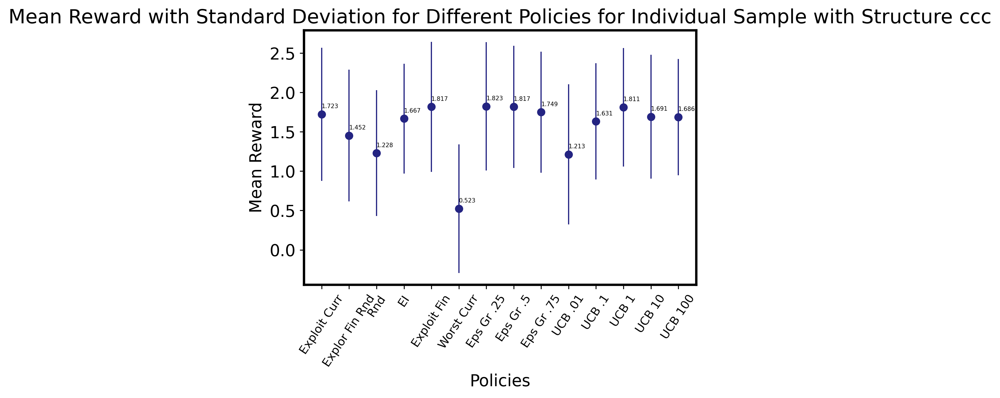

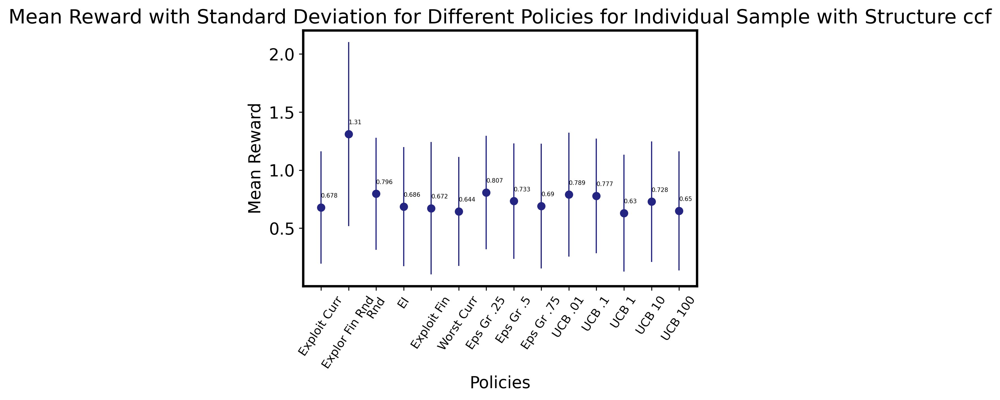

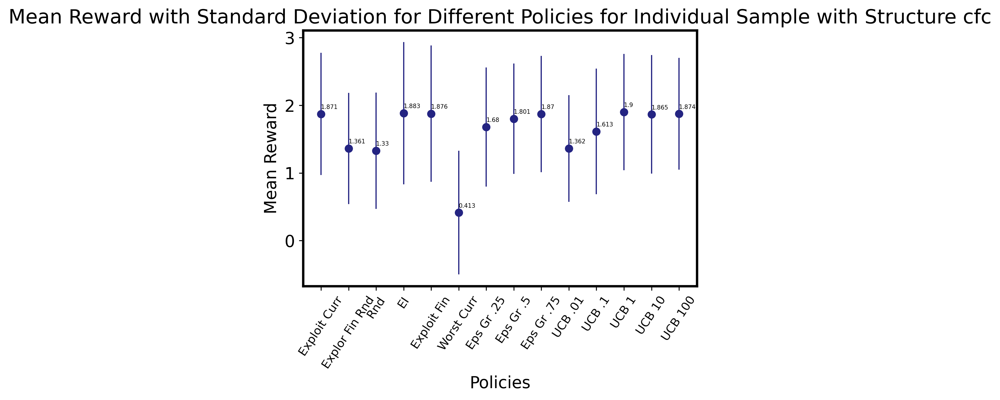

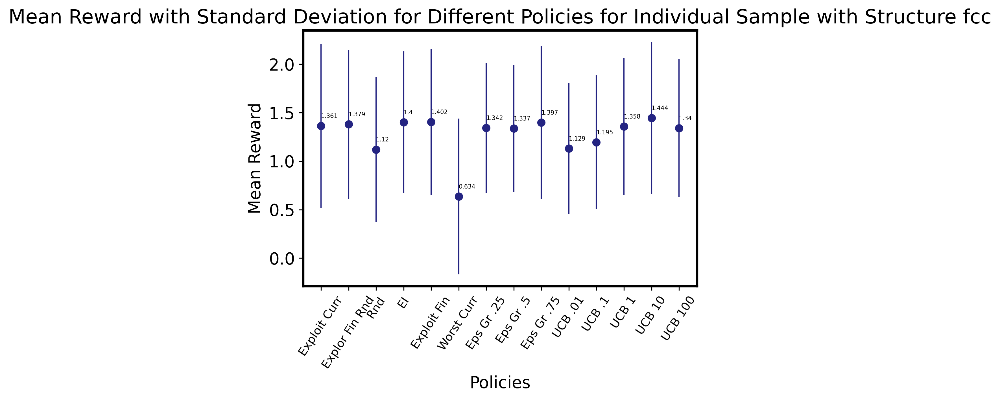

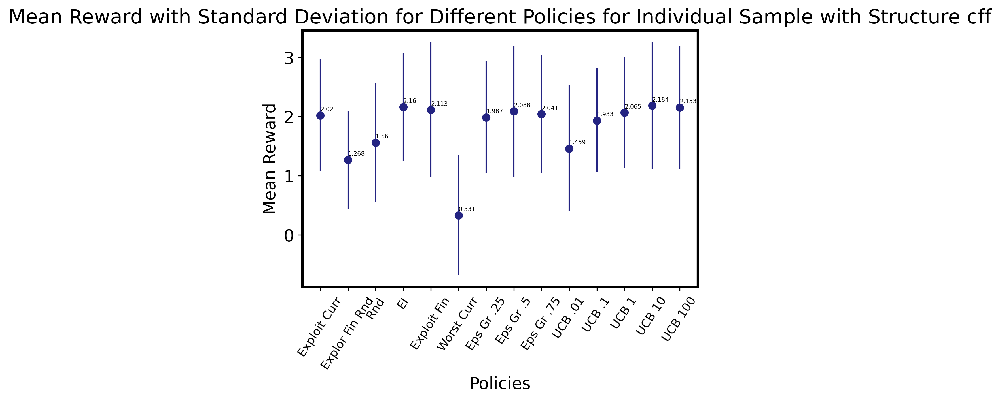

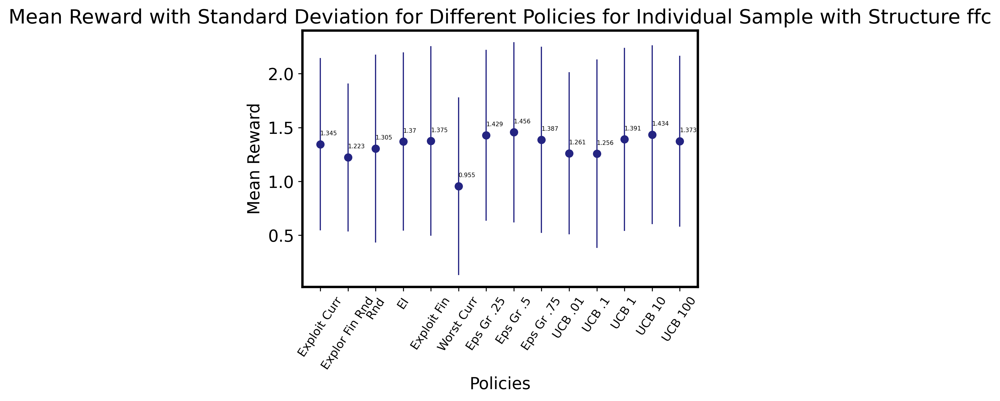

unique number: [20.]
unique number: [139.]
unique number: [86.]
unique number: [105.]
unique number: [102.]
unique number: [22.]


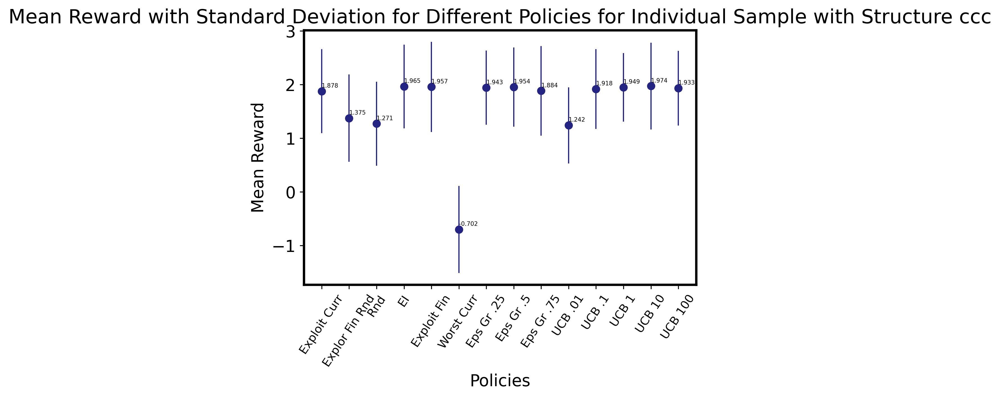

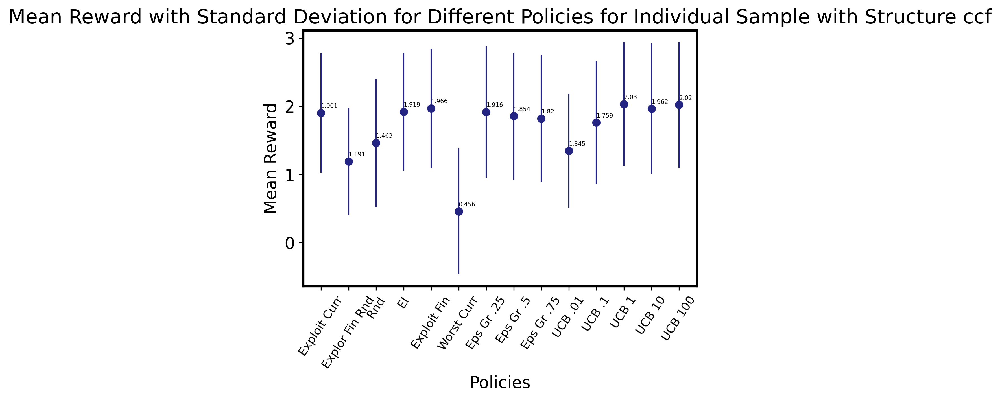

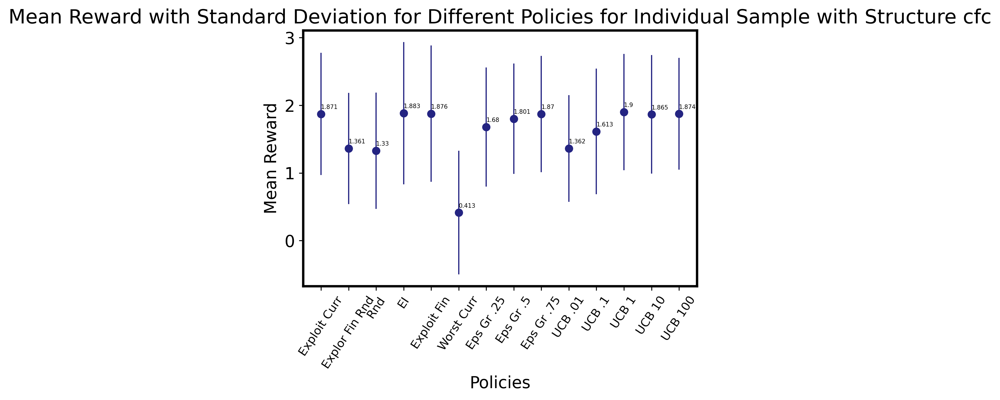

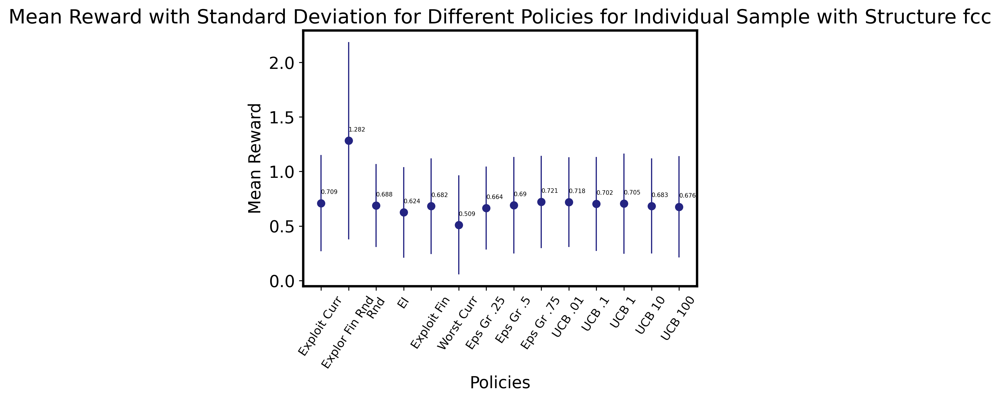

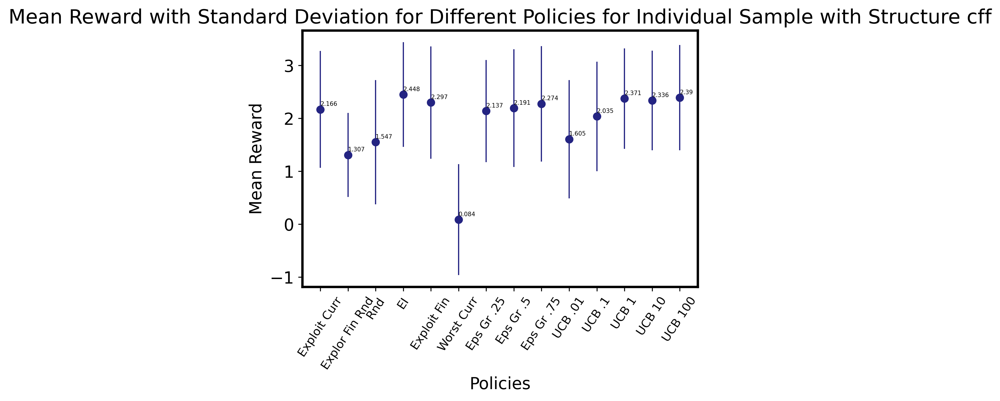

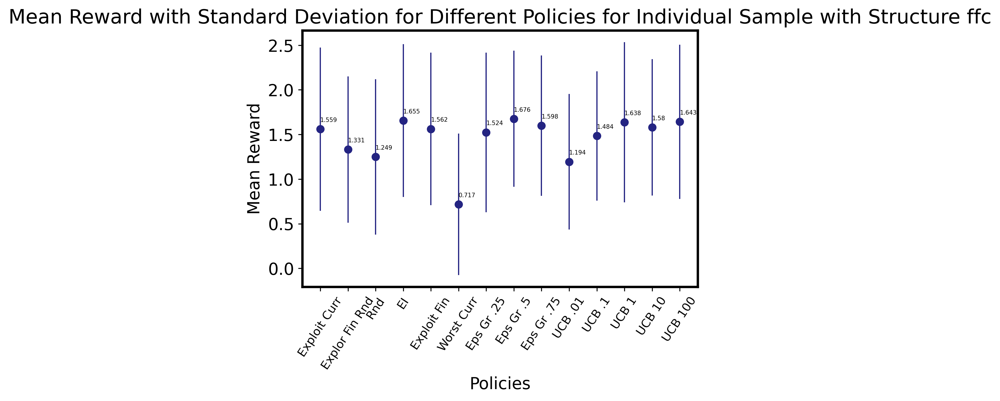

unique number: [5.]
unique number: [94.]
unique number: [143.]
unique number: [85.]
unique number: [12.]
unique number: [96.]


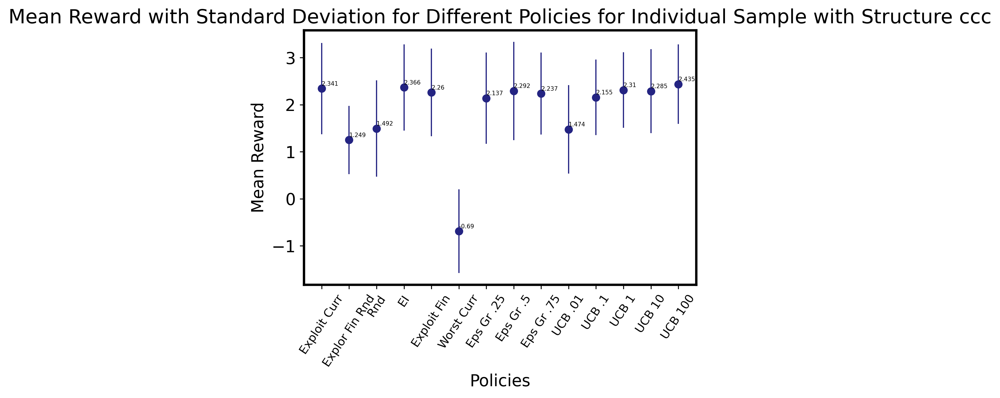

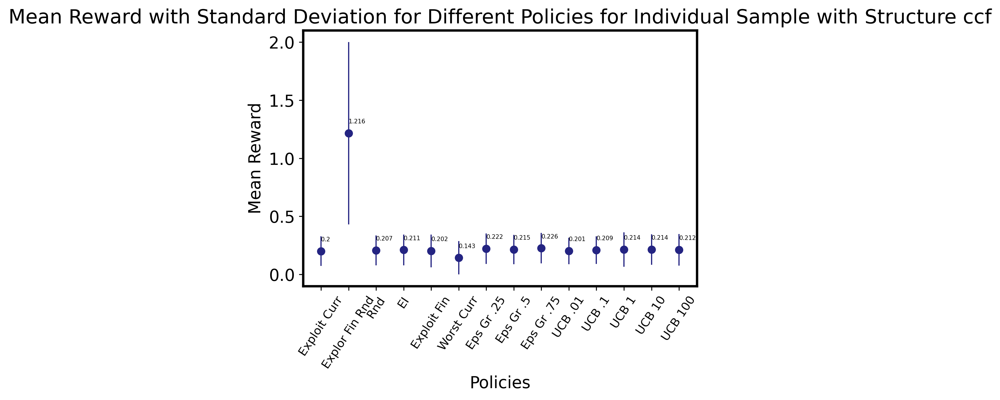

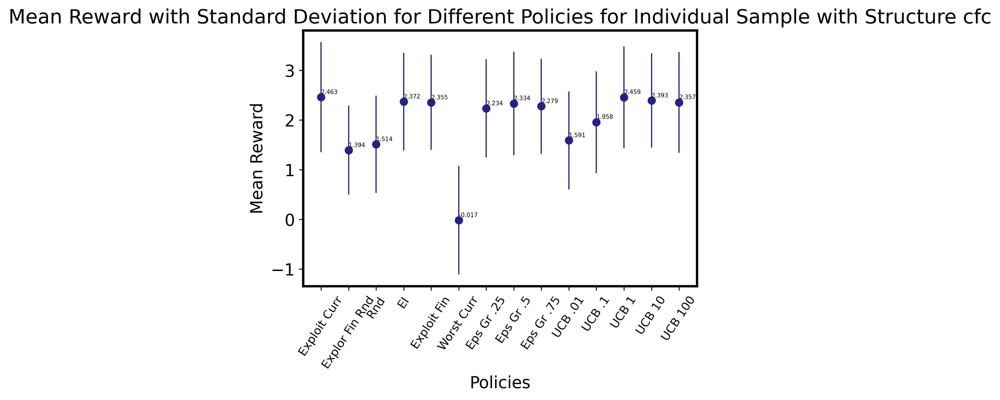

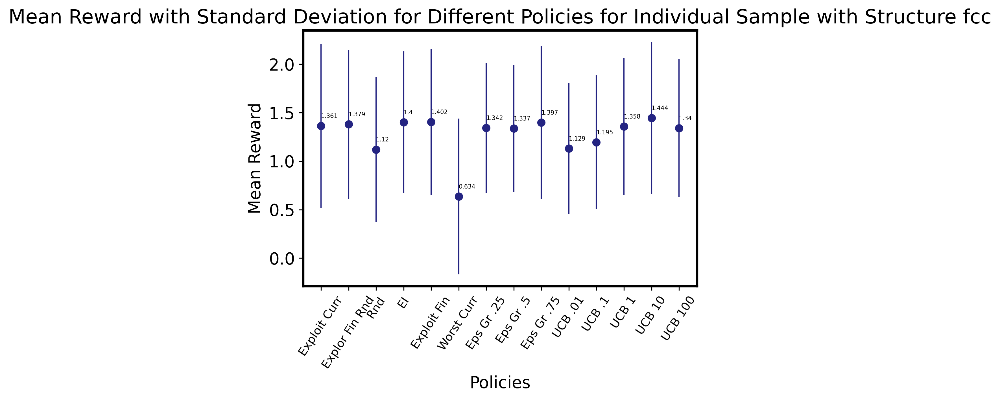

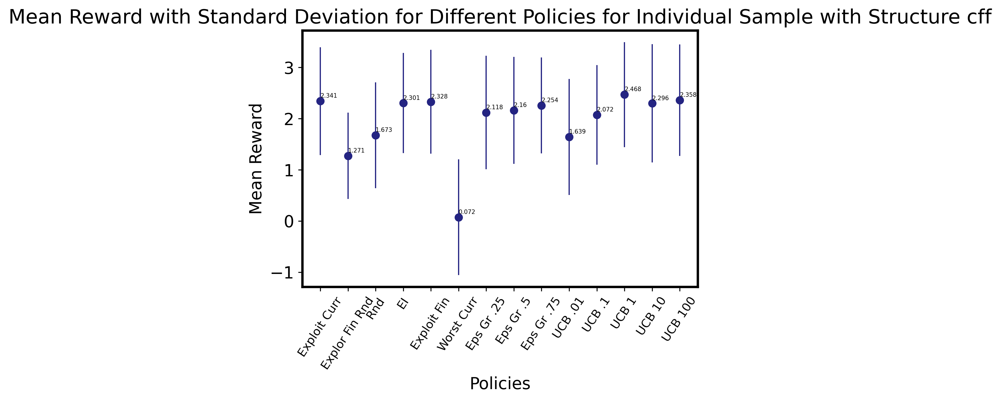

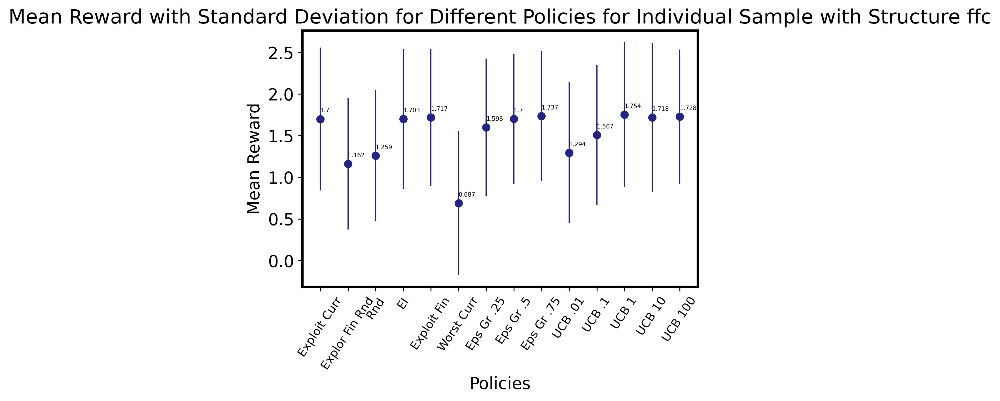

unique number: [11.]
unique number: [33.]
unique number: [77.]
unique number: [65.]
unique number: [117.]
unique number: [0.]


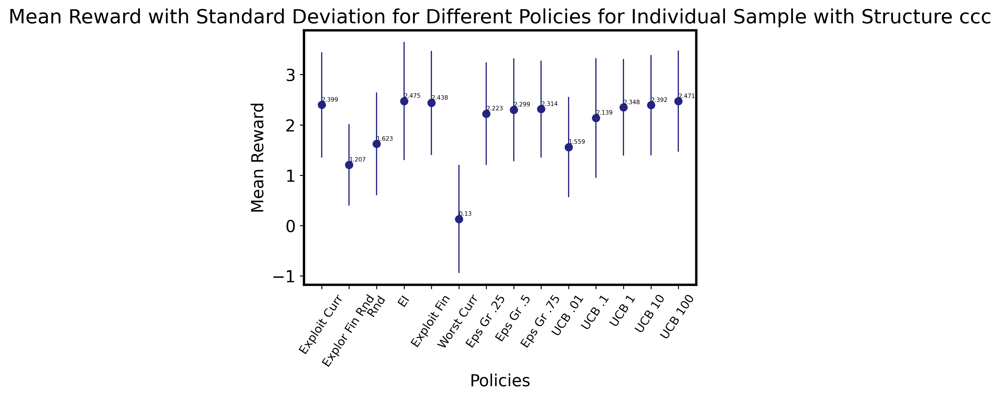

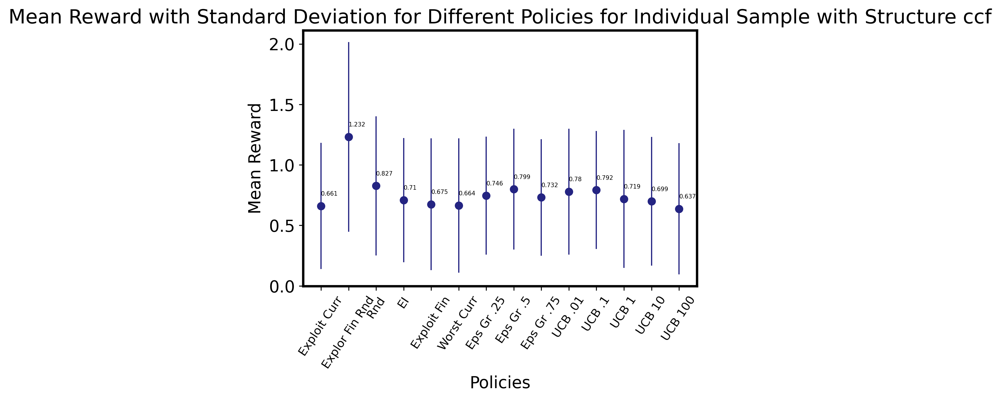

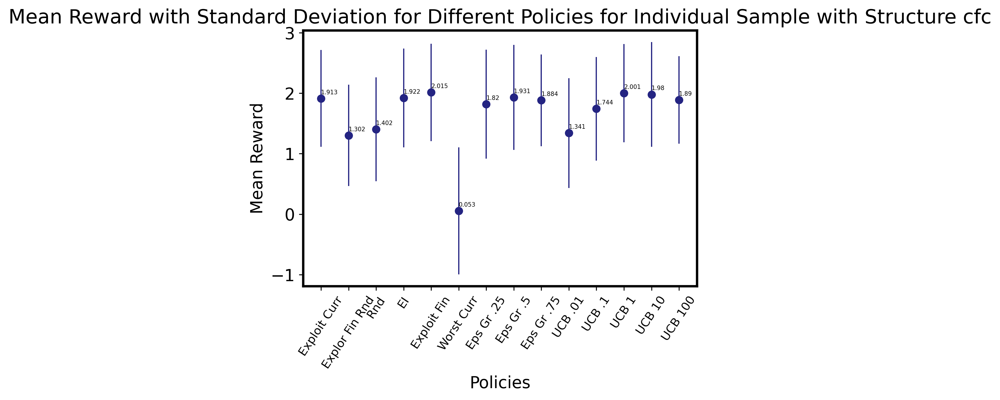

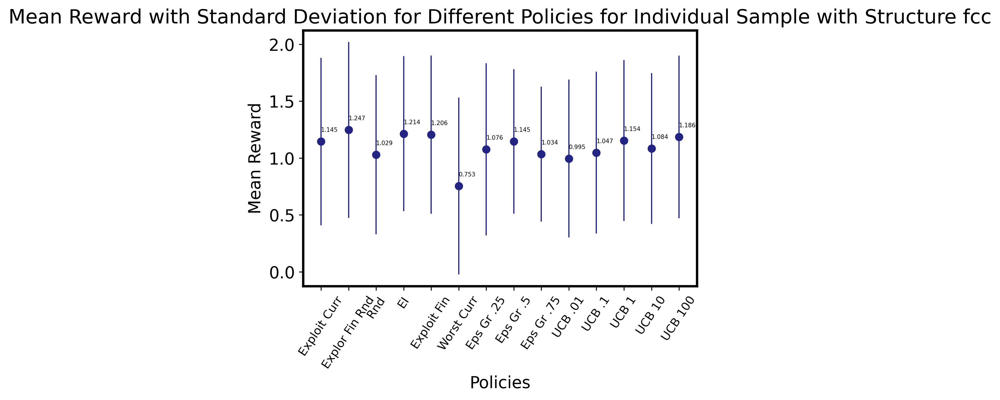

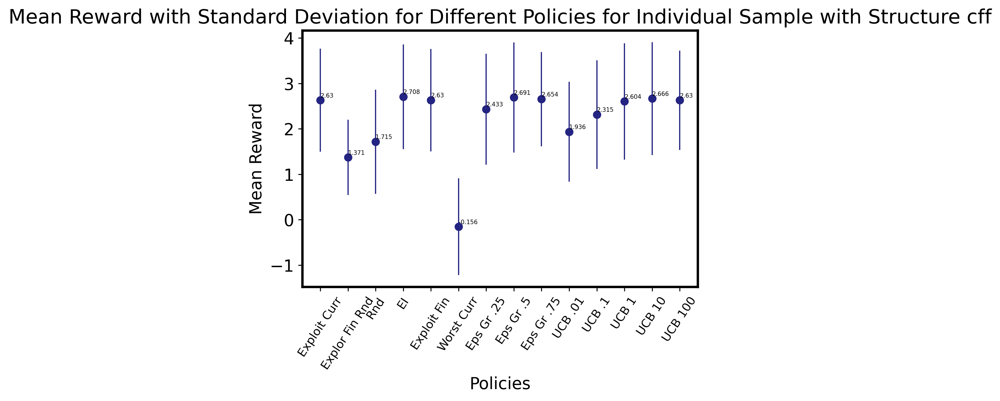

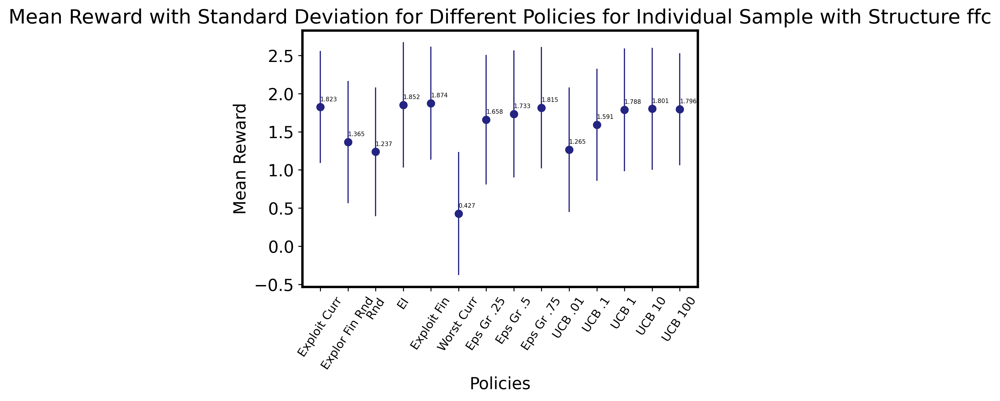

unique number: [18.]
unique number: [33.]
unique number: [77.]
unique number: [15.]
unique number: [76.]
unique number: [148.]


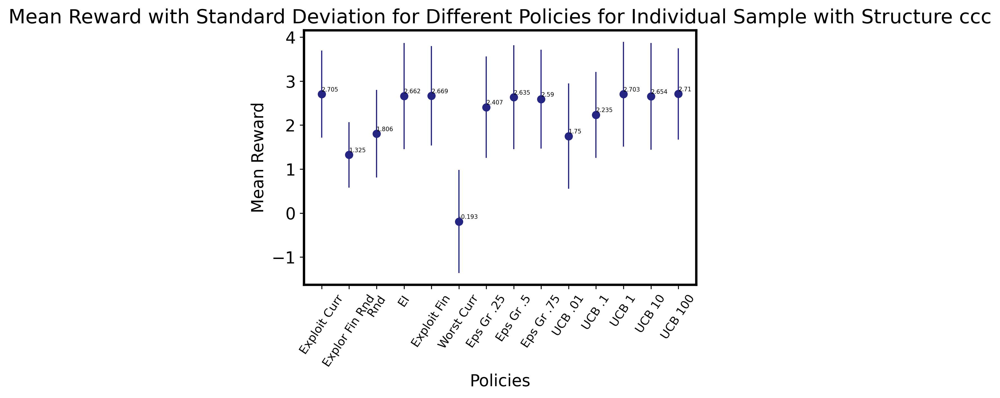

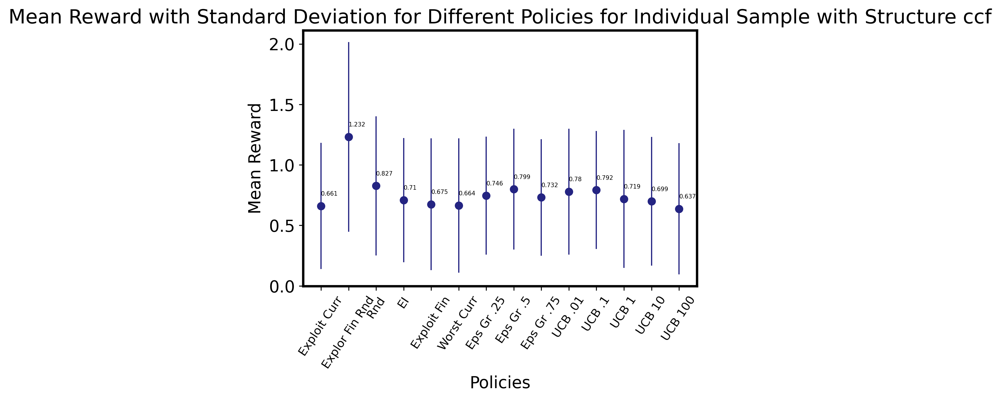

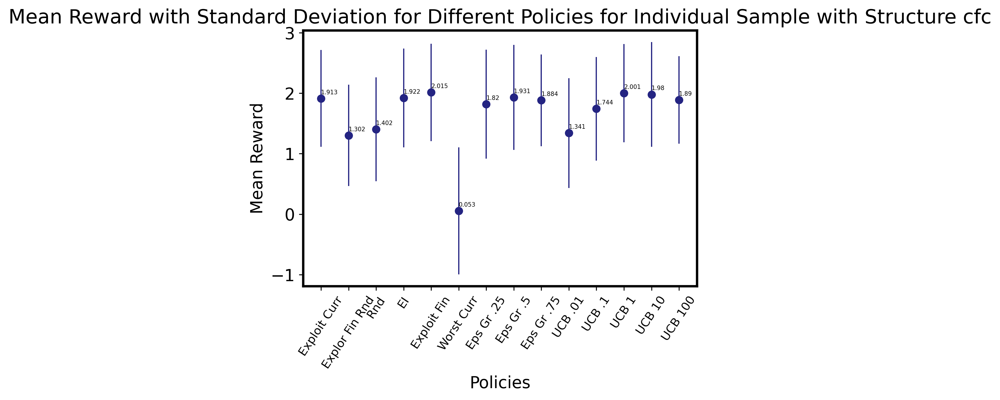

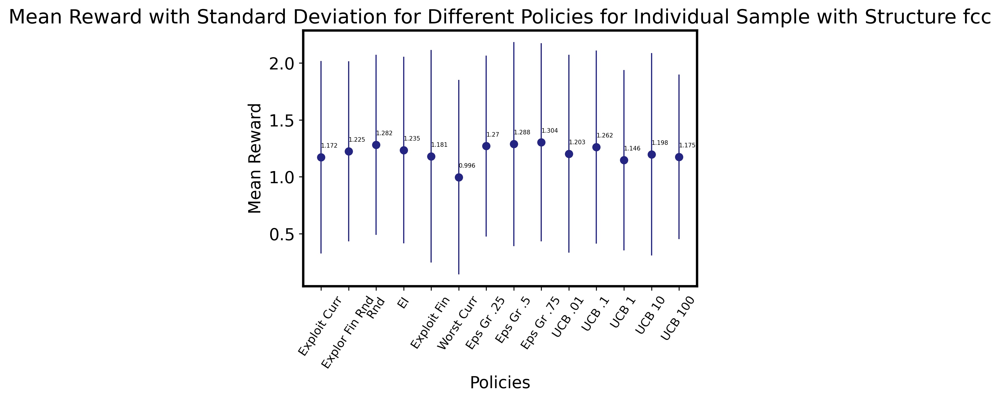

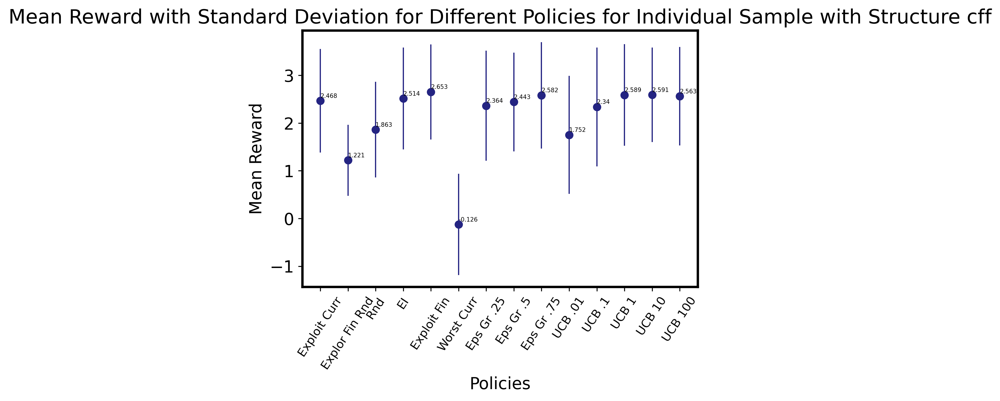

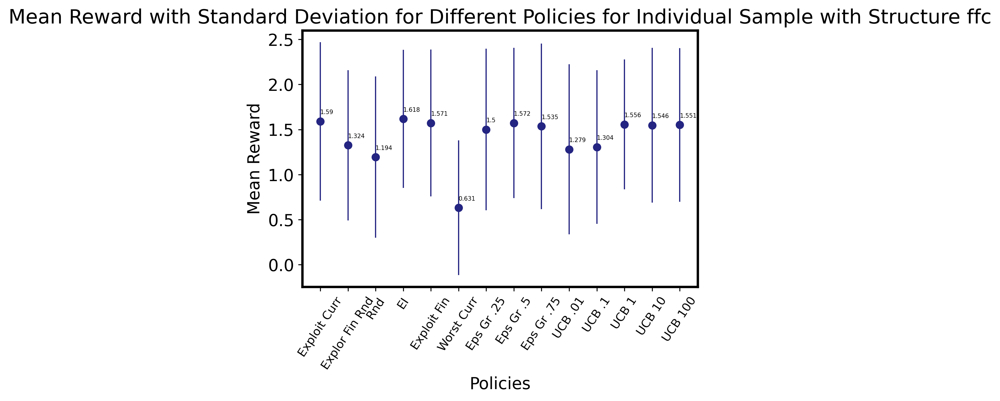

In [107]:
np.random.seed(4224)

# Here the number of rounds you want is up to you
rounds = 5

for i in range(rounds):
    
    
    selected_rows_all = []

    for structure in structures:

        # ignore the ccc in the variable names (they're arbitrary)

        unique_ccc = np.unique(structure[:, 0])
        #print(unique_ccc)

        selected_unique_ccc = np.random.choice(unique_ccc, size=1, replace=False)
        print(f'unique number: {selected_unique_ccc}')

        selected_rows_ccc = structure[structure[:, 0] == selected_unique_ccc]
        #print(selected_rows_ccc)

        selected_rows_all.append(selected_rows_ccc)
        #print(selected_rows_all)
    
    
    samples = selected_rows_all
    
    cnt_samp = -1

    for sample in samples:

        cnt_samp += 1
        curr_samp = structure_names[cnt_samp]

        means_ebar = []
        std_devs_ebar = []

        for policy in policies:

            # ignore the specific name of the variables (policy 2 and ccc) - this combination will only happen once;
            # moreover, the names of variables here are arbitrary and will be forgotten and re-initialized at every iteration within the foor loop

            policy_2_ccc = [i for i in sample if i[1]==policy]
            policy_2_ccc_len = len(policy_2_ccc)
            #print(f"Amount for structure {curr_struc} and policy {policy}: {policy_2_ccc_len}")

            policy_2_ccc_means = [i[2] for i in policy_2_ccc]
            policy_2_ccc_means_avg = mean(policy_2_ccc_means)
            #print(policy_2_ccc_means_avg)
            means_ebar.append(policy_2_ccc_means_avg)

            policy_2_ccc_sd = [i[3] for i in policy_2_ccc]
            policy_2_ccc_sd_avg = mean(policy_2_ccc_sd)
            #print(policy_2_ccc_sd_avg)
            std_devs_ebar.append(policy_2_ccc_sd_avg)

        # plt.errorbar(x_pos_ebar, means_ebar, std_devs_ebar, marker='o', linewidth=0, elinewidth=1)
        plt.errorbar(policy_names_ebar, means_ebar, std_devs_ebar, marker='o', linewidth=0, elinewidth=1)

        # Add y-values as annotations to the plot
        for x, y in zip(policy_names_ebar, means_ebar):
            plt.text(x, y+0.1, f'{round(y, 3)}', ha='left', va='center', fontsize=5)

        plt.xticks(x_pos_ebar, policy_names_ebar, fontsize=10, rotation=56.25)
        plt.xlabel('Policies')
        plt.ylabel('Mean Reward')
        plt.title(f'Mean Reward with Standard Deviation for Different Policies for Individual Sample with Structure {curr_samp}')
        plt.show()

It seems to be a somewhat emergent behavior. I say somewhat because sometimes the sample will have a very similar distribution, while other times kind of different, and others fairly significantly different. My guess is that it is an emergent behavior that one gets when averaging out.

The next question is:

Is there something that differs between the samples that follow the averaged-out distribution and those that do not? Maybe there are subclasses to the covariance structure classes. If that's the case, maybe the averaged out distribution appears that way due to a high amount of samples that follow it (aka if there are such subclasses, then the averaged-out distribution shape could follow that of a subclass that is overrepresented).

However, as an argument to this, we see that the distributions of the 6 covariance structure classes fall into only 2 types of distribution shapes despite the total sample number, and there is something to be said about that (that could potentially mean something), which would therefore mean that the samples that do not follow the averaged-out/emergent behavior are probably unique cases; or like we said, it's just naturally an emergent behavior.

Of course, all of this is under the assumption that the samples and their respective s1, s2, and s3 values were generated in a non-skewed manner and are distributed fairly evenly.
